## Setup, Loading Data and CDFs

In [1]:
DATA_NAME = 'pastis-full' 
TRANSFORM = 'gabor'
CHANNEL = 'green'
PARAM_CSV = "gabor_new.csv"

In [2]:
path_list = DATA_NAME.split("-") + TRANSFORM.split("-")
if CHANNEL:
    path_list.append(CHANNEL)
print(f"Name the notebook:\n{'_'.join(path_list[::-1])}.ipynb")
FULL_DATA_NAME='-'.join(path_list)

Name the notebook:
green_gabor_full_pastis.ipynb


In [3]:
import git
from pathlib import Path
import os
import pandas as pd
import numpy as np

ROOT_DIR = Path(git.Repo('.', search_parent_directories=True).working_tree_dir)
CWD = os.path.join(ROOT_DIR, "results", "case-studies", *path_list)

assert CWD == os.getcwd()
Path(os.path.join(CWD, "CSVs")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "plots")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "cache")).mkdir(exist_ok=True)

GROUP = 'layer' if TRANSFORM.split("-")[0] == 'wavelet' else ('band' if TRANSFORM.split("-")[0] == 'fourier' else 'filter_idx')
RERUN = False
SKIP_OPTIMIZE_STEP = False
CWD

'/Users/brandonmarks/Desktop/hierarchical-bayesian-model-validation/results/case-studies/pastis/full/gabor/green'

In [4]:
os.chdir(os.path.join(ROOT_DIR, "utilities"))
from testing import * # If MATLAB is not installed, open utilities and set to False
from plotting import *
from learned import *
os.chdir(CWD)
np.random.seed(0)

In [5]:
group_data_map = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}.pickle'))
group_total_samples = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}-size.pickle'))

# treat all as nonskewed for gabor grouped over frequency
nonskewed_filter_idxs = list(group_data_map.keys())

df = pd.read_csv(os.path.join(ROOT_DIR, "gabor", PARAM_CSV), index_col="index")
df = df.sort_index()

filter_group_map = (df.loc[:, ["wave_number", "aspect_ratio", "frequency"]]
                      .apply(tuple, axis=1)
                      .to_dict())

filter_group_map

{0: (2.0, 0.5, 0.044),
 1: (2.0, 0.5, 0.065),
 2: (2.0, 0.5, 0.096),
 3: (2.0, 0.5, 0.141),
 4: (2.0, 0.5, 0.208),
 5: (2.0, 0.5, 0.306),
 6: (2.0, 0.5, 0.45),
 7: (2.0, 1.0, 0.044),
 8: (2.0, 1.0, 0.065),
 9: (2.0, 1.0, 0.096),
 10: (2.0, 1.0, 0.141),
 11: (2.0, 1.0, 0.208),
 12: (2.0, 1.0, 0.306),
 13: (2.0, 1.0, 0.45),
 14: (3.0, 0.5, 0.044),
 15: (3.0, 0.5, 0.065),
 16: (3.0, 0.5, 0.096),
 17: (3.0, 0.5, 0.141),
 18: (3.0, 0.5, 0.208),
 19: (3.0, 0.5, 0.306),
 20: (3.0, 0.5, 0.45),
 21: (3.0, 1.0, 0.044),
 22: (3.0, 1.0, 0.065),
 23: (3.0, 1.0, 0.096),
 24: (3.0, 1.0, 0.141),
 25: (3.0, 1.0, 0.208),
 26: (3.0, 1.0, 0.306),
 27: (3.0, 1.0, 0.45),
 28: (4.0, 0.5, 0.044),
 29: (4.0, 0.5, 0.065),
 30: (4.0, 0.5, 0.096),
 31: (4.0, 0.5, 0.141),
 32: (4.0, 0.5, 0.208),
 33: (4.0, 0.5, 0.306),
 34: (4.0, 0.5, 0.45),
 35: (4.0, 1.0, 0.044),
 36: (4.0, 1.0, 0.065),
 37: (4.0, 1.0, 0.096),
 38: (4.0, 1.0, 0.141),
 39: (4.0, 1.0, 0.208),
 40: (4.0, 1.0, 0.306),
 41: (4.0, 1.0, 0.45)}

In [6]:
if 'fourier' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)[::3]
elif 'wavelet' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)
elif 'learned' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters
elif 'gabor' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters

cdfs_dir = os.path.join(ROOT_DIR, "results", "CDFs")
cdfs_list = sorted([os.path.join(cdfs_dir, i) for i in os.listdir(cdfs_dir)])
all_cdfs = combine_pickles(cdfs_list[0])
for cdf_dir in cdfs_list[:6]: # TODO For quick testing purposes. Currently excluding 20000 CDFs. Use cdfs_list[5:6] to access CDFs/_test
    all_cdfs = all_cdfs | combine_pickles(cdf_dir)
    
# group_data_map = {g : group_data_map[g][::100] for g in GROUPS} # TODO For quick testing purposes
group_total_samples

{0: 16384000,
 1: 16384000,
 2: 16384000,
 3: 16384000,
 4: 16384000,
 5: 16384000,
 6: 16384000,
 7: 16384000,
 8: 16384000,
 9: 16384000,
 10: 16384000,
 11: 16384000,
 12: 16384000,
 13: 16384000,
 14: 16384000,
 15: 16384000,
 16: 16384000,
 17: 16384000,
 18: 16384000,
 19: 16384000,
 20: 16384000,
 21: 16384000,
 22: 16384000,
 23: 16384000,
 24: 16384000,
 25: 16384000,
 26: 16384000,
 27: 16384000,
 28: 16384000,
 29: 16384000,
 30: 16384000,
 31: 16384000,
 32: 16384000,
 33: 16384000,
 34: 16384000,
 35: 16384000,
 36: 16384000,
 37: 16384000,
 38: 16384000,
 39: 16384000,
 40: 16384000,
 41: 16384000}

Running 12760 CDFs


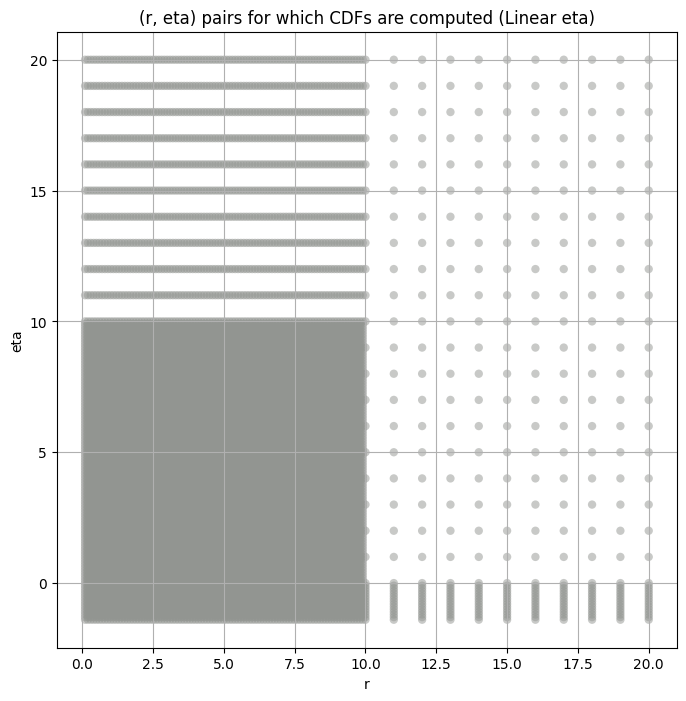

,"(r,eta),cdf",r,eta,cdf,variance,kurtosis
0,"((0.1, -1.4), <scipy.interpolate._fitpack2.Int...",0.1,-1.4,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.628800e+06,554265.000000
1,"((0.1, -1.3), <scipy.interpolate._fitpack2.Int...",0.1,-1.3,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.991680e+07,96192.272727
2,"((0.1, -1.2), <scipy.interpolate._fitpack2.Int...",0.1,-1.2,<scipy.interpolate._fitpack2.InterpolatedUniva...,2.395008e+08,29390.000000
3,"((0.1, -1.1), <scipy.interpolate._fitpack2.Int...",0.1,-1.1,<scipy.interpolate._fitpack2.InterpolatedUniva...,1.037837e+09,11997.692308
4,"((0.1, -1.0), <scipy.interpolate._fitpack2.Int...",0.1,-1.0,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.632429e+09,5874.890110


In [7]:
warnings.filterwarnings('ignore', category=RuntimeWarning)

all_cdfs_df = create_kurt_var_ksstat_df(all_cdfs)
fine_cdfs_df = all_cdfs_df.copy()
all_cdfs_df = all_cdfs_df[(np.round(all_cdfs_df['r'], 1) == all_cdfs_df['r']) & (np.round(all_cdfs_df['eta'], 1) == all_cdfs_df['eta'])]
all_cdfs_df = all_cdfs_df.reset_index(drop=True)
all_cdfs = {x[0] : x[1] for x in all_cdfs_df["(r,eta),cdf"]}
                                             
var_values_dict = dict()
kurt_values_dict = dict()
master_df = pd.DataFrame(columns=[GROUP]).set_index(GROUP)
temp_cdf = all_cdfs_df
print(f"Running {all_cdfs_df.shape[0]} CDFs")
create_scatter_plot(all_cdfs_df);
all_cdfs_df.head()

## Bootstrapping the Variance and Kurtosis

In [8]:
n_bootstrap = int(1e3) # TODO For quick testing purposes
bootstrap_size = int(1e3) # TODO For quick testing purposes
ci = 0.99

In [9]:
bootstrap_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))
master_df_var_kurt_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

if True or not master_df_var_kurt_path.exists(): # TODO For quick testing purposes
    for group in GROUPS:
        print(f'{GROUP.capitalize()} {group}: {str(filter_group_map[group])}')
        obs_var, var_lower, var_upper, var_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                n_bootstrap=n_bootstrap, 
                                                                                bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                metric= np.var, 
                                                                                ci=ci)
        obs_kurt, kurt_lower, kurt_upper, kurt_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                    n_bootstrap=n_bootstrap, 
                                                                                    bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                    metric= stats.kurtosis, ci=ci)  
        master_df.loc[group, 'obs_var'], master_df.loc[group, 'var_lower'], master_df.loc[group, 'var_upper'] = obs_var, var_lower, var_upper
        master_df.loc[group, 'obs_kurt'], master_df.loc[group, 'kurt_lower'], master_df.loc[group, 'kurt_upper'] = obs_kurt, kurt_lower, kurt_upper
        master_df.loc[group, 'total_samples'] = group_total_samples[group]
        master_df.loc[group, 'filter_group'] = str(filter_group_map[group])

    master_df.to_csv(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

master_df = pd.read_csv(master_df_var_kurt_path, index_col=GROUP)
var_kurt_df = pd.read_csv(bootstrap_path, index_col=GROUP)
master_df

Filter_idx 0: (2.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 1: (2.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 2: (2.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 3: (2.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 4: (2.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 5: (2.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 6: (2.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 7: (2.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 8: (2.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 9: (2.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 10: (2.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 11: (2.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 12: (2.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 13: (2.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 14: (3.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 15: (3.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 16: (3.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 17: (3.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 18: (3.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 19: (3.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 20: (3.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 21: (3.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 22: (3.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 23: (3.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 24: (3.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 25: (3.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 26: (3.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 27: (3.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 28: (4.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 29: (4.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 30: (4.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 31: (4.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 32: (4.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 33: (4.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 34: (4.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 35: (4.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 36: (4.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 37: (4.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 38: (4.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 39: (4.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 40: (4.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 41: (4.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group
filter_idx,,,,,,,,
0,47.174680,38.207870,57.344060,3.933039,1.657051,12.296394,16384000.0,"(2.0, 0.5, 0.044)"
1,19.006046,15.189773,23.890121,4.491074,1.763123,14.001322,16384000.0,"(2.0, 0.5, 0.065)"
2,7.427561,5.993431,9.240600,5.486764,2.033071,25.079126,16384000.0,"(2.0, 0.5, 0.096)"
3,2.900405,2.280916,3.859326,6.906760,2.456280,31.497519,16384000.0,"(2.0, 0.5, 0.141)"
4,1.072249,0.825040,1.457324,9.078379,3.249782,60.512690,16384000.0,"(2.0, 0.5, 0.208)"
5,0.312033,0.235514,0.426686,12.071183,3.256212,78.446620,16384000.0,"(2.0, 0.5, 0.306)"
6,0.175037,0.131404,0.260224,13.582359,3.521244,97.919840,16384000.0,"(2.0, 0.5, 0.45)"
7,61.506790,51.126873,75.659220,4.155252,1.651941,15.351008,16384000.0,"(2.0, 1.0, 0.044)"
8,26.697110,21.600980,33.705860,4.946486,1.928312,17.890352,16384000.0,"(2.0, 1.0, 0.065)"


## Initial Grid Search and Hypothesis Test Plots

In [10]:
EXCLUDE_CUTOFFS = [0, 50, 100, 200] # TODO For quick testing purposes
SCALE_CAP = 1e5

In [11]:
augmented_var_df_path = Path(os.path.join(CWD, "CSVs", "augmented_var_df.csv"))
augmented_var_df = var_kurt_df[['obs_var']].copy()
augmented_var_df
for val in EXCLUDE_CUTOFFS:
    temp_arr = []
    for group in GROUPS:
        if val != 0:
            temp_arr.append(np.var(group_data_map[group][val:-val]))
        else:
            temp_arr.append(np.var(group_data_map[group]))

    augmented_var_df[f"var_exclude_{val}"] = temp_arr
augmented_var_df

,obs_var,var_exclude_0,var_exclude_50,var_exclude_100,var_exclude_200
filter_idx,,,,,
0,47.174680,47.174679,45.431381,44.328167,42.624519
1,19.006046,19.006046,18.249411,17.781240,17.059925
2,7.427561,7.427561,7.096591,6.901300,6.603100
3,2.900405,2.900405,2.751130,2.667497,2.542594
4,1.072249,1.072249,1.008389,0.974879,0.925471
5,0.312033,0.312033,0.290015,0.278983,0.263142
6,0.175037,0.175037,0.161717,0.155457,0.146655
7,61.506790,61.506790,59.089039,57.625610,55.389732
8,26.697110,26.697109,25.558859,24.873623,23.826769


In [ ]:
master_df_combo_path = Path(os.path.join(CWD, "CSVs", "master_df_combo.csv"))
rEtaKsstats_dict_path = Path(os.path.join(CWD, "cache", "rEtaKsstats_dict.pickle"))

rEtaKsstats_dict = dict()

if RERUN or not master_df_combo_path.exists():
    sorted_params = sorted(all_cdfs)
    ksstats_dict = dict()

    for i, group in enumerate(GROUPS): # TODO For quick testing purposes
        print(f"####\n{GROUP.capitalize()}, {group}: {str(filter_group_map[group])}")
        sample = group_data_map[group]
        if len(sample) == 0:
            continue
        group_cdfs_df = all_cdfs_df.copy()
        master_df.loc[group, 'kstest_stat_initial'] = 1

        for j in range(len(EXCLUDE_CUTOFFS)):

            exclude_cutoff = EXCLUDE_CUTOFFS[j]
            exclude_cutoff = int(exclude_cutoff)

            if exclude_cutoff == 0:
                augmented_var = np.var(group_data_map[group]) 
            else:
                augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])
                if augmented_var == np.var(group_data_map[group]):
                    continue 
                
            group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
            ksstats, initial_param, min_stat = gridsearch(sample, all_cdfs, debug=True, scales=group_cdfs_df['scale'])
            augmented_var_df.loc[group, f"kstest_stat_{exclude_cutoff}"] = min_stat
            group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] = ksstats
            
            print(group, exclude_cutoff, min_stat, augmented_var)
            
            if (min_stat < master_df.loc[group, 'kstest_stat_initial']) and not np.isclose(min_stat, master_df.loc[group, 'kstest_stat_initial'], 1e-6):
                inital_min_stat = min_stat
                inital_best_param = initial_param
                master_df.loc[group, 'kstest_stat_initial'] = min_stat
                initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                master_df.loc[group, 'initial_r'], master_df.loc[group, 'initial_eta'] = initial_param
                master_df.loc[group, 'initial_scale'] = initial_scale
                master_df.loc[group, 'initial_exclude_cutoff'] = exclude_cutoff
                master_df.loc[group, 'best_augmented_var'] = augmented_var
        
        ksstats = group_cdfs_df[f"ksstat_exclude_{int(master_df.loc[group, 'initial_exclude_cutoff'])}"]
            
        print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
        
        cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
        master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

        best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

        group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
        group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

        group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

        group_dict = {'r' : group_cdfs_df['r'], 'eta' : group_cdfs_df['eta']}
        group_dict.update({f'ksstat_exclude_{exclude_cutoff}' : group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] for exclude_cutoff in EXCLUDE_CUTOFFS[:j+1]})
        rEtaKsstats_dict[group] = group_dict

        cols = ['pass_var', 'pass_kstest', 'pass_kurt']

        fig = combo_test_plot(group_cdfs_df, cols, 
                            plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: {', '.join([col[5:].capitalize() for col in cols])} Exclude:{master_df.loc[group, 'initial_exclude_cutoff']}", 
                            target_var = None,
                            best_param = inital_best_param,
                            best_ksstat=inital_min_stat
                            )
        
        fig.figure.savefig(os.path.join(CWD, "plots", f"full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)

        # Optional: 
        # Create plots of bootstrapped variance and kurtosis for varying confidence intervals
        # fig_var = create_ci_scatter_plot(group_cdfs_df, var_values_dict, metric='variance', group=group)
        # fig_kurt = create_ci_scatter_plot(group_cdfs_df, kurt_values_dict, metric='kurtosis', group=group)

        # fig_var.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_var)
        # fig_kurt.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_kurt)

    # new: add parameter information
    master_df.insert(0, 'params', master_df.index.map(filter_group_map))

    master_df.to_csv(master_df_combo_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)
    augmented_var_df.to_csv(augmented_var_df_path)

augmented_var_df = pd.read_csv(augmented_var_df_path, index_col=GROUP)
master_df = pd.read_csv(master_df_combo_path, index_col=GROUP)
rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df

####
Filter_idx, 0: (2.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 0 0.0010495100819513103 47.17468


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 50 0.0014013896062562287 45.43138


  0%|          | 0/12760 [00:00<?, ?it/s]

## Optimization

In [ ]:
master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
master_df[f'best_r'] = master_df['initial_r']
master_df[f'best_eta'] = master_df['initial_eta']
master_df[f'best_scale'] = master_df['initial_scale']
master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

Filter_idx 0, (2.0, 0.5, 0.044):


  0%|          | 0/1233 [00:00<?, ?it/s]

Finding Minimum after computing 1233 CDFs
filter_idx 0, 0.0 + 100 = 100, ksstat: 0.002408293349125734, var: 62.732688903808594


  0%|          | 0/1233 [00:00<?, ?it/s]

Finding Minimum after computing 1233 CDFs
filter_idx 0, 0.0 + 75 = 75, ksstat: 0.002034120015931007, var: 63.35177230834961


  0%|          | 0/1233 [00:00<?, ?it/s]

Finding Minimum after computing 1233 CDFs
filter_idx 0, 0.0 + 50 = 50, ksstat: 0.0016220851222150875, var: 64.04041290283203


  0%|          | 0/1233 [00:00<?, ?it/s]

Finding Minimum after computing 1233 CDFs
filter_idx 0, 0.0 + 25 = 25, ksstat: 0.0011755540339543798, var: 64.84291076660156


  0%|          | 0/1233 [00:00<?, ?it/s]

Finding Minimum after computing 1233 CDFs
filter_idx 0, 0.0 + 0 = 0, ksstat: 0.0006254417920011912, var: 66.02749633789062
Number of samples: 100000, Without approximation : 16384000.0


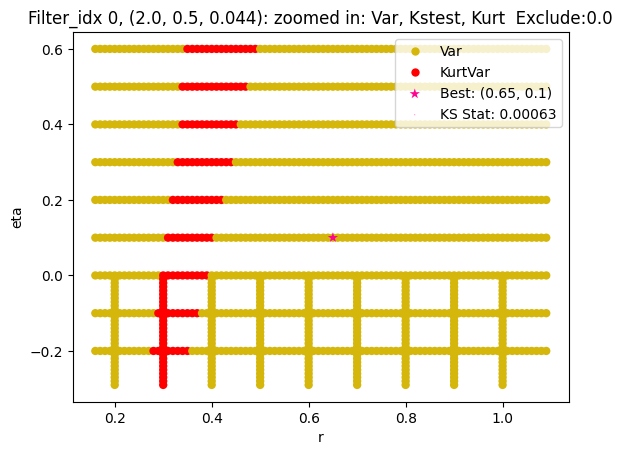

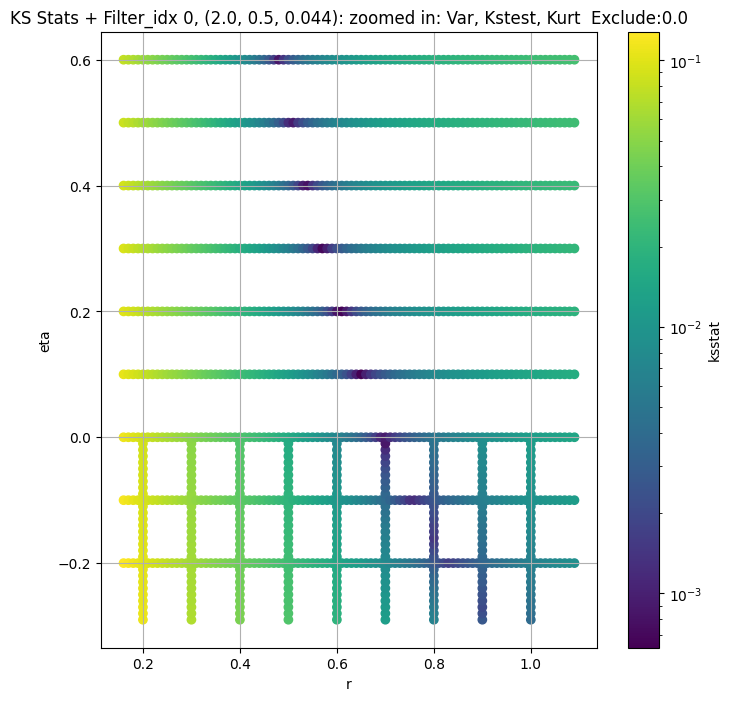

Filter_idx 1, (2.0, 0.5, 0.065):


  0%|          | 0/1377 [00:00<?, ?it/s]

Finding Minimum after computing 1377 CDFs
filter_idx 1, 0.0 + 100 = 100, ksstat: 0.00270367617561703, var: 24.952470779418945


  0%|          | 0/1377 [00:00<?, ?it/s]

Finding Minimum after computing 1377 CDFs
filter_idx 1, 0.0 + 75 = 75, ksstat: 0.002267515750994254, var: 25.20589828491211


  0%|          | 0/1377 [00:00<?, ?it/s]

Finding Minimum after computing 1377 CDFs
filter_idx 1, 0.0 + 50 = 50, ksstat: 0.001831022569401819, var: 25.487577438354492


  0%|          | 0/1377 [00:00<?, ?it/s]

Finding Minimum after computing 1377 CDFs
filter_idx 1, 0.0 + 25 = 25, ksstat: 0.0014071404272654187, var: 25.815853118896484


  0%|          | 0/1377 [00:00<?, ?it/s]

Finding Minimum after computing 1377 CDFs
filter_idx 1, 0.0 + 0 = 0, ksstat: 0.0008164264919700223, var: 26.310842514038086
Number of samples: 100000, Without approximation : 16384000.0


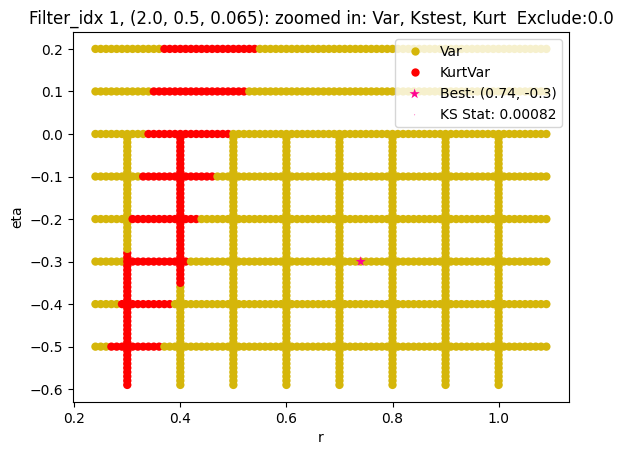

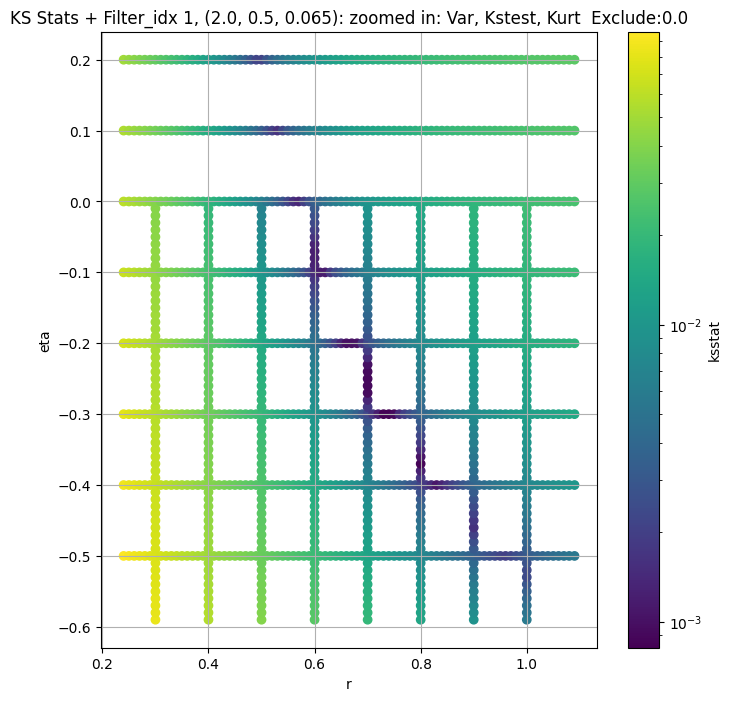

Filter_idx 2, (2.0, 0.5, 0.096):


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 2, 0.0 + 100 = 100, ksstat: 0.0024714700396727407, var: 8.987088203430176


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 2, 0.0 + 75 = 75, ksstat: 0.002084134972954437, var: 9.091241836547852


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 2, 0.0 + 50 = 50, ksstat: 0.0016811427045100302, var: 9.208061218261719


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 2, 0.0 + 25 = 25, ksstat: 0.0012368281720654996, var: 9.346096992492676


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 2, 0.0 + 0 = 0, ksstat: 0.0006077554708004418, var: 9.566076278686523
Number of samples: 100000, Without approximation : 16384000.0


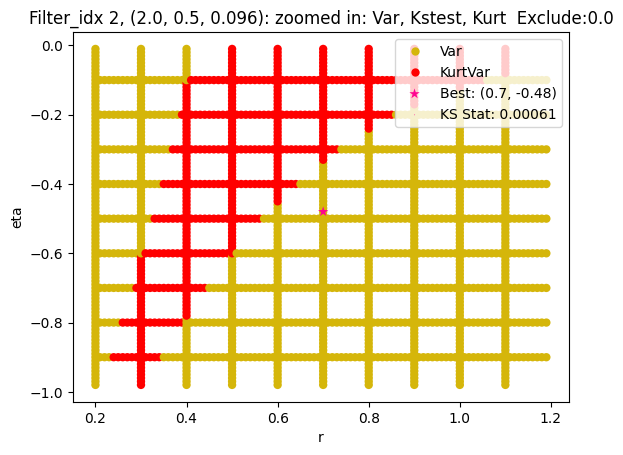

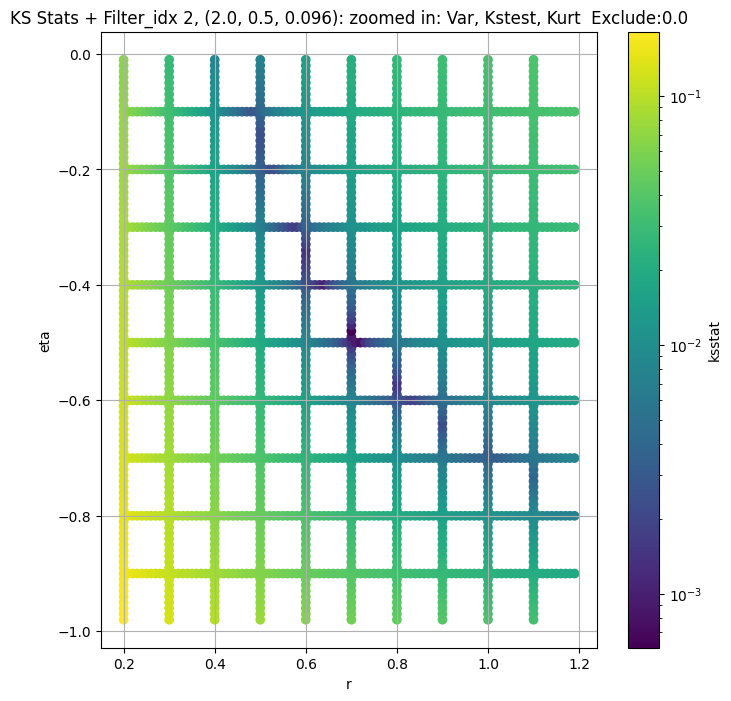

Filter_idx 3, (2.0, 0.5, 0.141):


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 50.0 + 100 = 150, ksstat: 0.0035969733404180512, var: 3.3373093605041504


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 50.0 + 75 = 125, ksstat: 0.003443807172040847, var: 3.373335599899292


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 50.0 + 50 = 100, ksstat: 0.0032042764711888785, var: 3.412224531173706


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 50.0 + 25 = 75, ksstat: 0.002647430073541332, var: 3.4548285007476807


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 50.0 + 0 = 50, ksstat: 0.002318094277753778, var: 3.502800941467285


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 50.0 + -25 = 25, ksstat: 0.00227642662774985, var: 3.5599796772003174


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 3, 50.0 + -50 = 0, ksstat: 0.001729512283758755, var: 3.654214382171631
Number of samples: 100000, Without approximation : 16384000.0


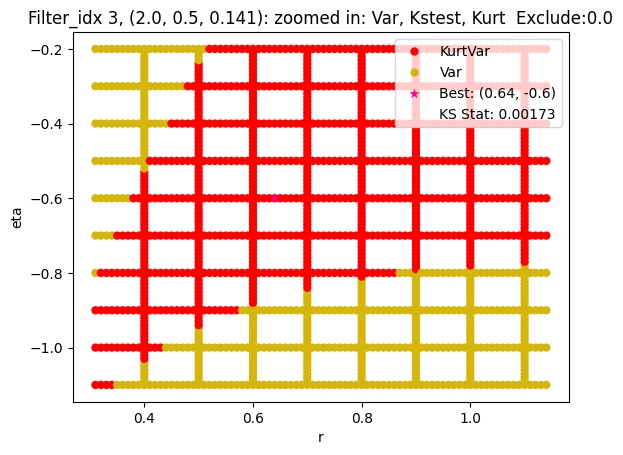

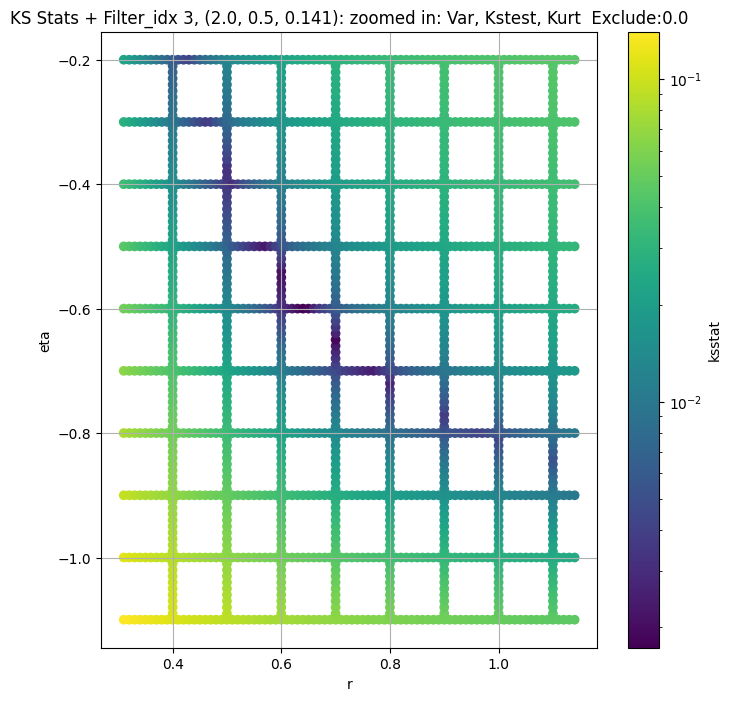

Filter_idx 4, (2.0, 0.5, 0.208):


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 4, 0.0 + 100 = 100, ksstat: 0.004165949800964963, var: 1.1524196863174438


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 4, 0.0 + 75 = 75, ksstat: 0.003945652470452865, var: 1.168676733970642


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 4, 0.0 + 50 = 50, ksstat: 0.0035189397663656363, var: 1.1871328353881836


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 4, 0.0 + 25 = 25, ksstat: 0.003297381222660989, var: 1.209471344947815


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 4, 0.0 + 0 = 0, ksstat: 0.002860485224983389, var: 1.2468936443328857
Number of samples: 100000, Without approximation : 16384000.0


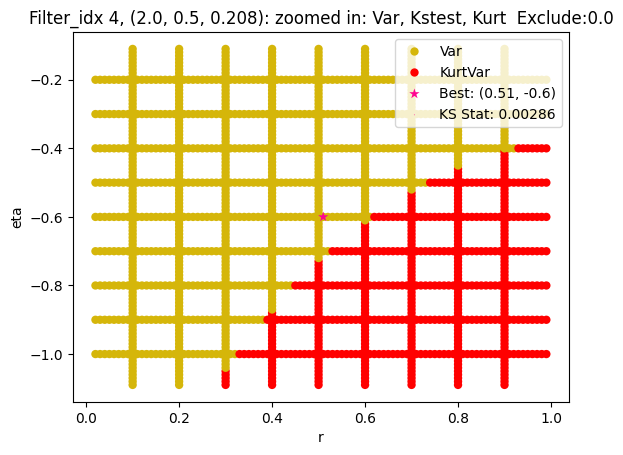

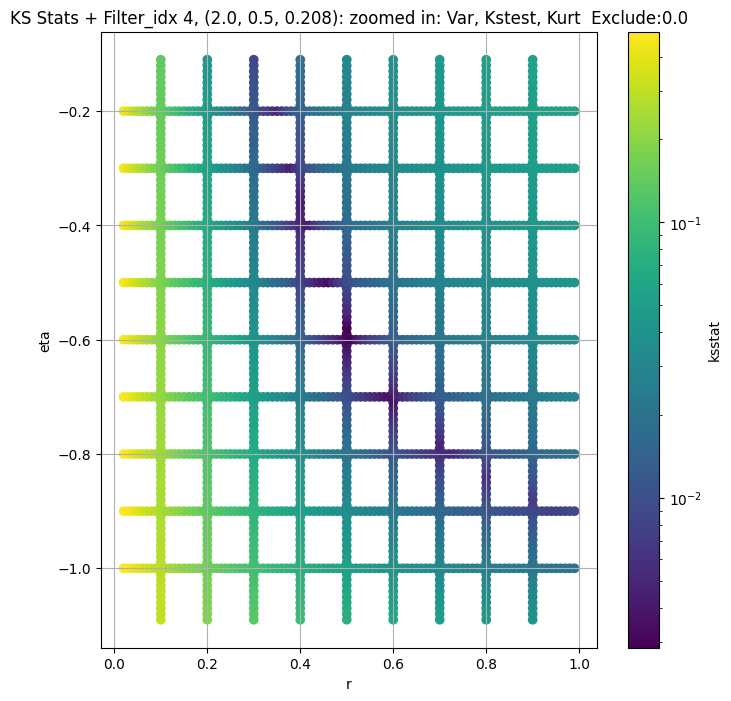

Filter_idx 5, (2.0, 0.5, 0.306):


  0%|          | 0/1221 [00:00<?, ?it/s]

Finding Minimum after computing 1221 CDFs
filter_idx 5, 0.0 + 100 = 100, ksstat: 0.004788869707956556, var: 0.2827361524105072


  0%|          | 0/1221 [00:00<?, ?it/s]

Finding Minimum after computing 1221 CDFs
filter_idx 5, 0.0 + 75 = 75, ksstat: 0.004577440830212498, var: 0.28742238879203796


  0%|          | 0/1221 [00:00<?, ?it/s]

Finding Minimum after computing 1221 CDFs
filter_idx 5, 0.0 + 50 = 50, ksstat: 0.004310719048759529, var: 0.2928341329097748


  0%|          | 0/1221 [00:00<?, ?it/s]

Finding Minimum after computing 1221 CDFs
filter_idx 5, 0.0 + 25 = 25, ksstat: 0.004107140626528616, var: 0.2995060086250305


  0%|          | 0/1221 [00:00<?, ?it/s]

Finding Minimum after computing 1221 CDFs
filter_idx 5, 0.0 + 0 = 0, ksstat: 0.0035604858244857457, var: 0.3119598627090454
Number of samples: 100000, Without approximation : 16384000.0


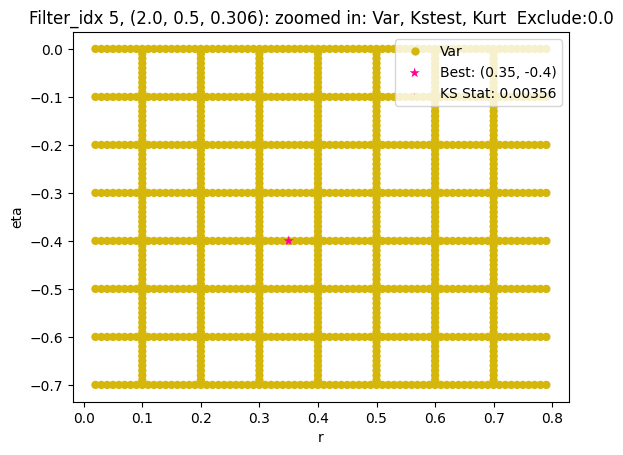

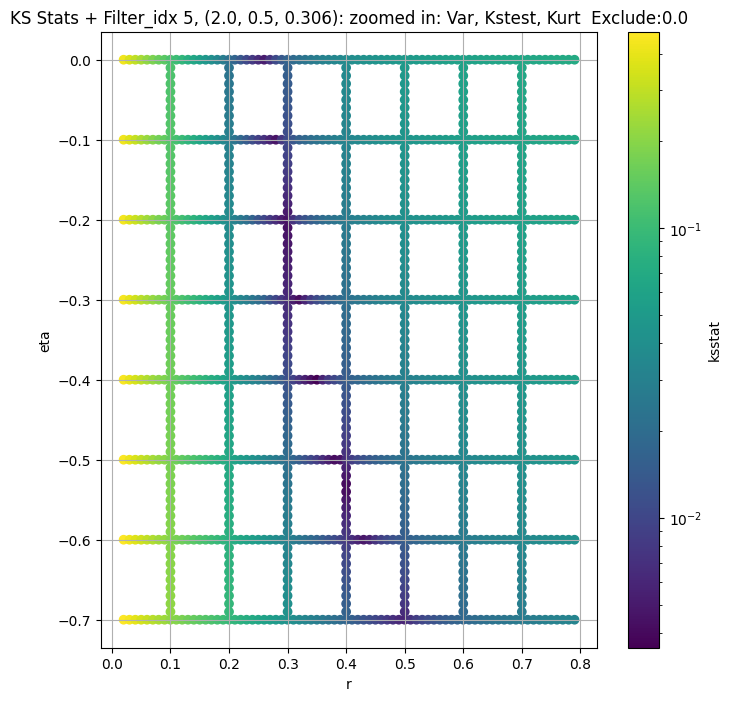

Filter_idx 6, (2.0, 0.5, 0.45):


  0%|          | 0/1221 [00:00<?, ?it/s]

Finding Minimum after computing 1221 CDFs
filter_idx 6, 0.0 + 100 = 100, ksstat: 0.005279620732823731, var: 0.15728893876075745


  0%|          | 0/1221 [00:00<?, ?it/s]

Finding Minimum after computing 1221 CDFs
filter_idx 6, 0.0 + 75 = 75, ksstat: 0.004832370460511659, var: 0.15994805097579956


  0%|          | 0/1221 [00:00<?, ?it/s]

Finding Minimum after computing 1221 CDFs
filter_idx 6, 0.0 + 50 = 50, ksstat: 0.004864498906282988, var: 0.16302607953548431


  0%|          | 0/1221 [00:00<?, ?it/s]

Finding Minimum after computing 1221 CDFs
filter_idx 6, 0.0 + 25 = 25, ksstat: 0.004397938406759061, var: 0.16685016453266144


  0%|          | 0/1221 [00:00<?, ?it/s]

Finding Minimum after computing 1221 CDFs
filter_idx 6, 0.0 + 0 = 0, ksstat: 0.003659602437476317, var: 0.17440786957740784
Number of samples: 100000, Without approximation : 16384000.0


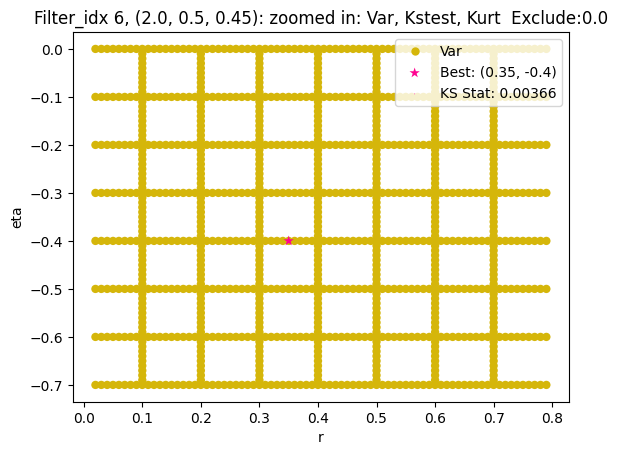

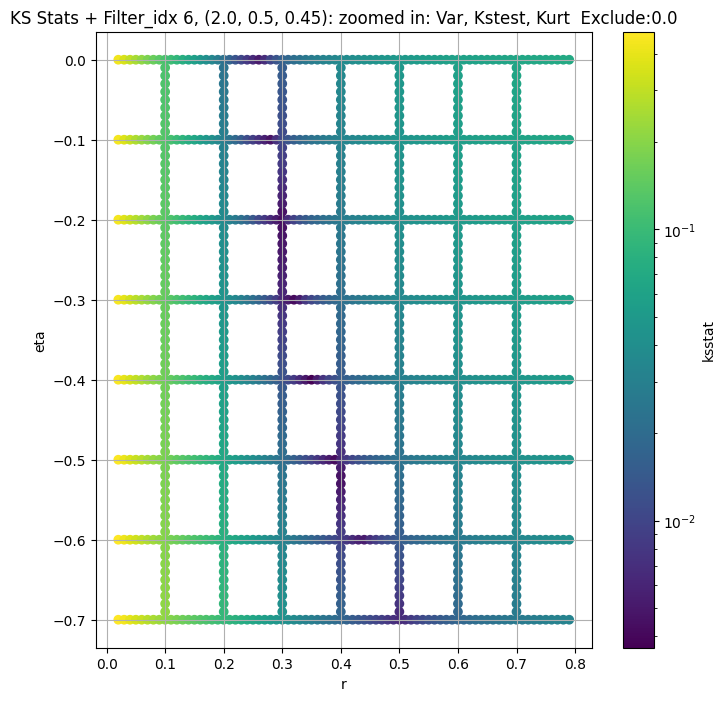

Filter_idx 7, (2.0, 1.0, 0.044):


  0%|          | 0/702 [00:00<?, ?it/s]

Finding Minimum after computing 702 CDFs
filter_idx 7, 0.0 + 100 = 100, ksstat: 0.0026975956845073715, var: 82.80439758300781


  0%|          | 0/702 [00:00<?, ?it/s]

Finding Minimum after computing 702 CDFs
filter_idx 7, 0.0 + 75 = 75, ksstat: 0.002227735600893843, var: 83.669921875


  0%|          | 0/702 [00:00<?, ?it/s]

Finding Minimum after computing 702 CDFs
filter_idx 7, 0.0 + 50 = 50, ksstat: 0.0017170812337314878, var: 84.63763427734375


  0%|          | 0/702 [00:00<?, ?it/s]

Finding Minimum after computing 702 CDFs
filter_idx 7, 0.0 + 25 = 25, ksstat: 0.0012313213505387166, var: 85.77052307128906


  0%|          | 0/702 [00:00<?, ?it/s]

Finding Minimum after computing 702 CDFs
filter_idx 7, 0.0 + 0 = 0, ksstat: 0.0005720827620433085, var: 87.4276123046875
Number of samples: 100000, Without approximation : 16384000.0


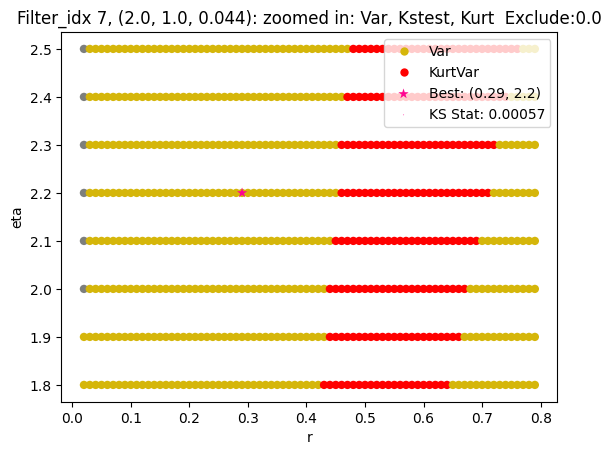

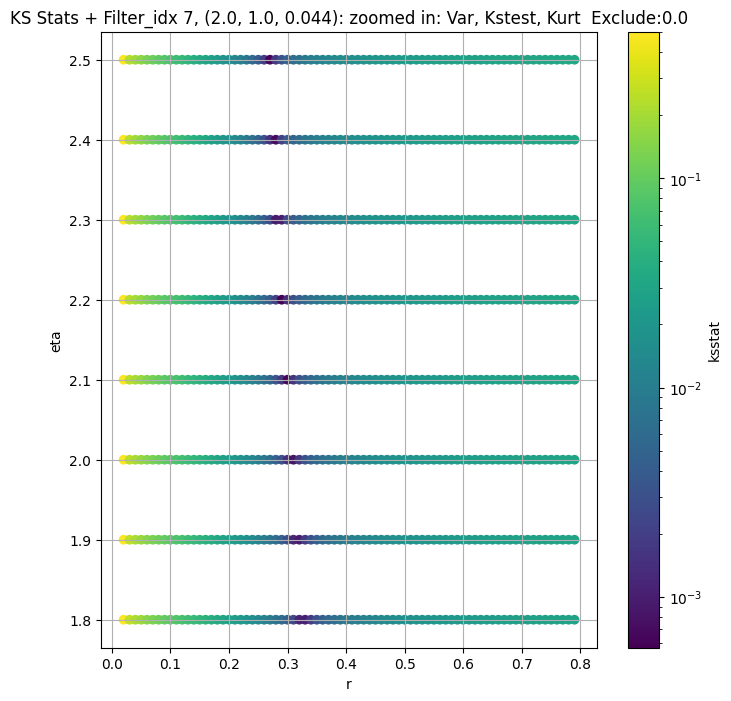

Filter_idx 8, (2.0, 1.0, 0.065):


  0%|          | 0/880 [00:00<?, ?it/s]

Finding Minimum after computing 880 CDFs
filter_idx 8, 0.0 + 100 = 100, ksstat: 0.002964557345002193, var: 33.76655578613281


  0%|          | 0/880 [00:00<?, ?it/s]

Finding Minimum after computing 880 CDFs
filter_idx 8, 0.0 + 75 = 75, ksstat: 0.0024939858165178297, var: 34.13486862182617


  0%|          | 0/880 [00:00<?, ?it/s]

Finding Minimum after computing 880 CDFs
filter_idx 8, 0.0 + 50 = 50, ksstat: 0.0019873771519561823, var: 34.54494857788086


  0%|          | 0/880 [00:00<?, ?it/s]

Finding Minimum after computing 880 CDFs
filter_idx 8, 0.0 + 25 = 25, ksstat: 0.0014167711345475231, var: 35.0211296081543


  0%|          | 0/880 [00:00<?, ?it/s]

Finding Minimum after computing 880 CDFs
filter_idx 8, 0.0 + 0 = 0, ksstat: 0.0007472313325494195, var: 35.73371124267578
Number of samples: 100000, Without approximation : 16384000.0


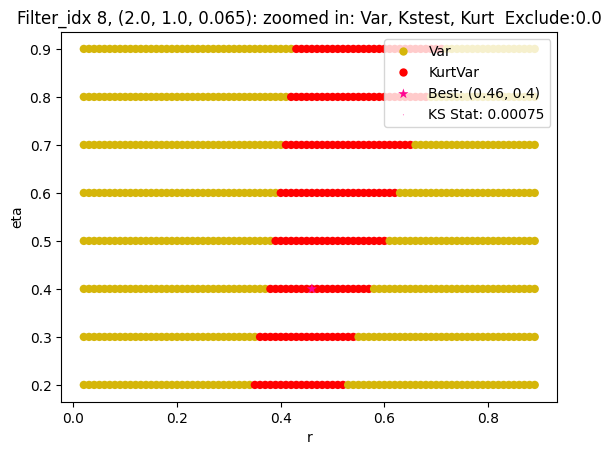

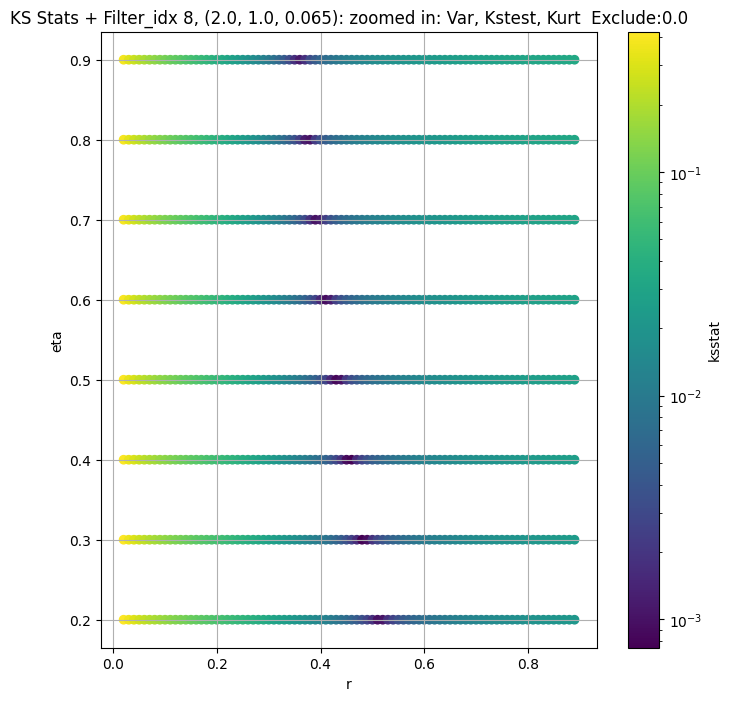

Filter_idx 9, (2.0, 1.0, 0.096):


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 9, 0.0 + 100 = 100, ksstat: 0.002621460460167202, var: 13.108659744262695


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 9, 0.0 + 75 = 75, ksstat: 0.002215839272820791, var: 13.261651039123535


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 9, 0.0 + 50 = 50, ksstat: 0.001810796139534665, var: 13.43337631225586


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 9, 0.0 + 25 = 25, ksstat: 0.00132710154600435, var: 13.63688850402832


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 9, 0.0 + 0 = 0, ksstat: 0.0008861910758155567, var: 13.965508460998535
Number of samples: 100000, Without approximation : 16384000.0


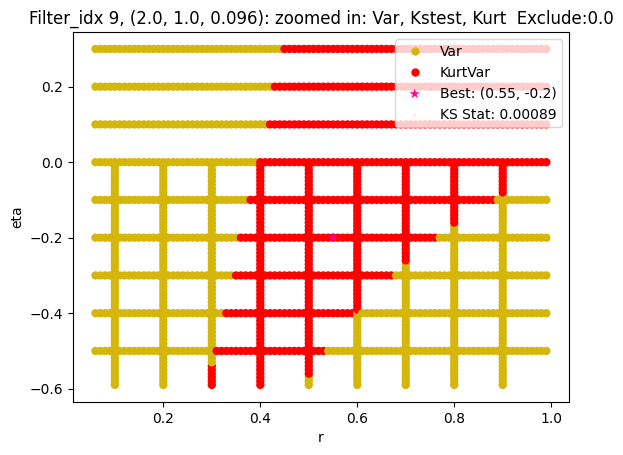

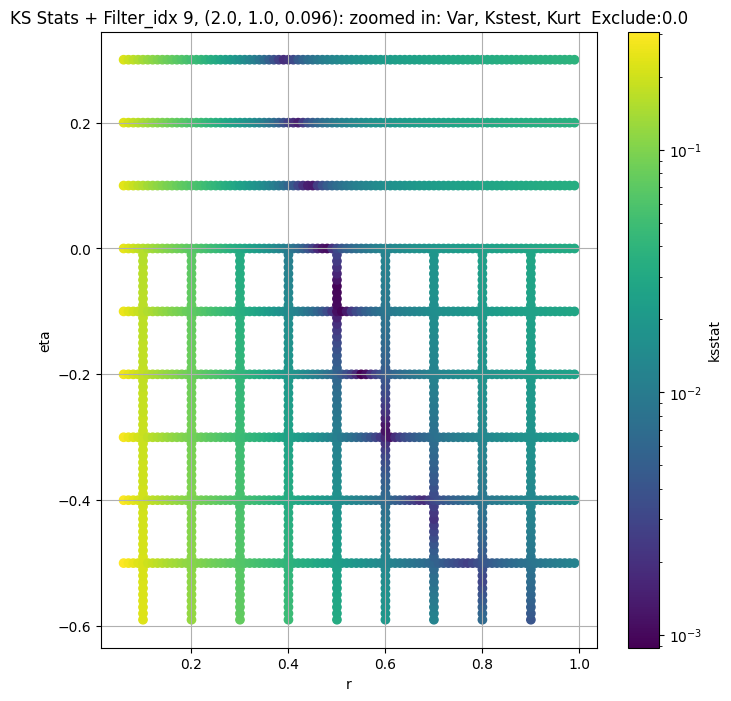

Filter_idx 10, (2.0, 1.0, 0.141):


  0%|          | 0/1530 [00:00<?, ?it/s]

Finding Minimum after computing 1530 CDFs
filter_idx 10, 0.0 + 100 = 100, ksstat: 0.0027116672819492704, var: 4.7849297523498535


  0%|          | 0/1530 [00:00<?, ?it/s]

Finding Minimum after computing 1530 CDFs
filter_idx 10, 0.0 + 75 = 75, ksstat: 0.002357845309512413, var: 4.846071720123291


  0%|          | 0/1530 [00:00<?, ?it/s]

Finding Minimum after computing 1530 CDFs
filter_idx 10, 0.0 + 50 = 50, ksstat: 0.0018838503644290627, var: 4.915036678314209


  0%|          | 0/1530 [00:00<?, ?it/s]

Finding Minimum after computing 1530 CDFs
filter_idx 10, 0.0 + 25 = 25, ksstat: 0.0015409564186697894, var: 4.997281074523926


  0%|          | 0/1530 [00:00<?, ?it/s]

Finding Minimum after computing 1530 CDFs
filter_idx 10, 0.0 + 0 = 0, ksstat: 0.0010489858628195473, var: 5.132245063781738
Number of samples: 100000, Without approximation : 16384000.0


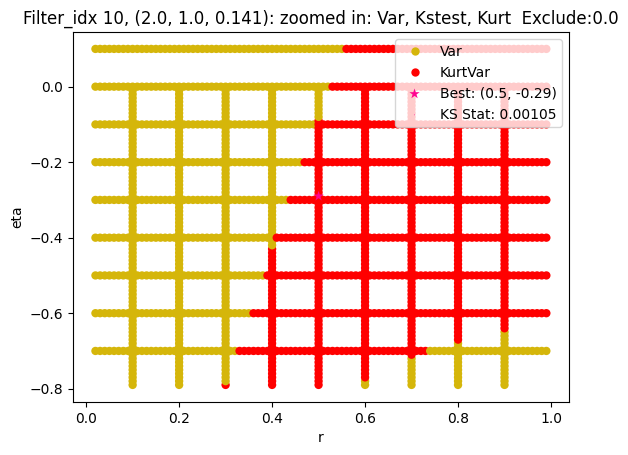

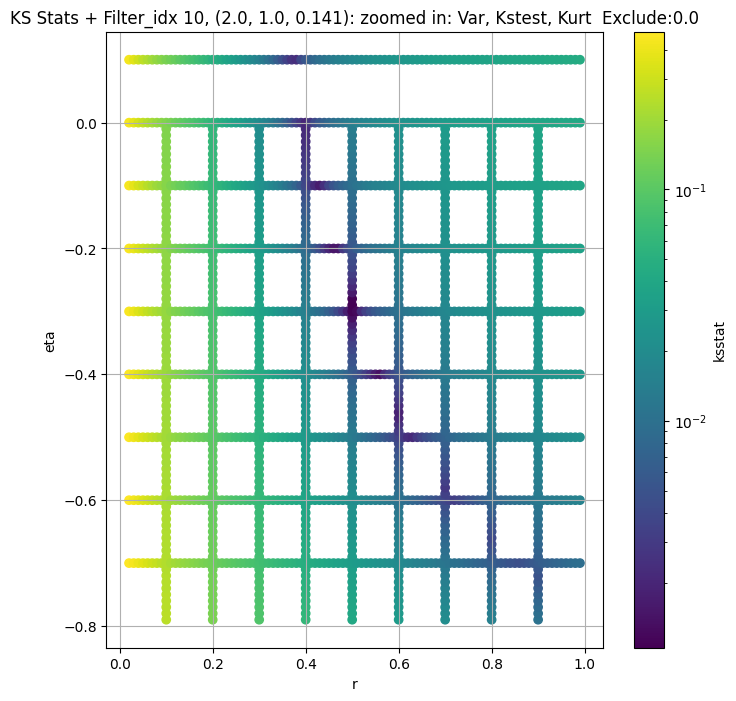

Filter_idx 11, (2.0, 1.0, 0.208):


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 11, 0.0 + 100 = 100, ksstat: 0.003078780223137151, var: 1.6788110733032227


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 11, 0.0 + 75 = 75, ksstat: 0.0029438853685185284, var: 1.7029694318771362


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 11, 0.0 + 50 = 50, ksstat: 0.002398085133108574, var: 1.7304250001907349


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 11, 0.0 + 25 = 25, ksstat: 0.0022961505913714486, var: 1.763468623161316


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 11, 0.0 + 0 = 0, ksstat: 0.0018133404935992414, var: 1.8196674585342407
Number of samples: 100000, Without approximation : 16384000.0


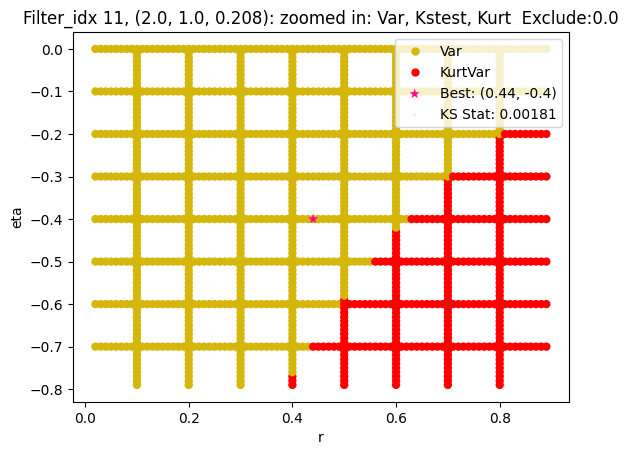

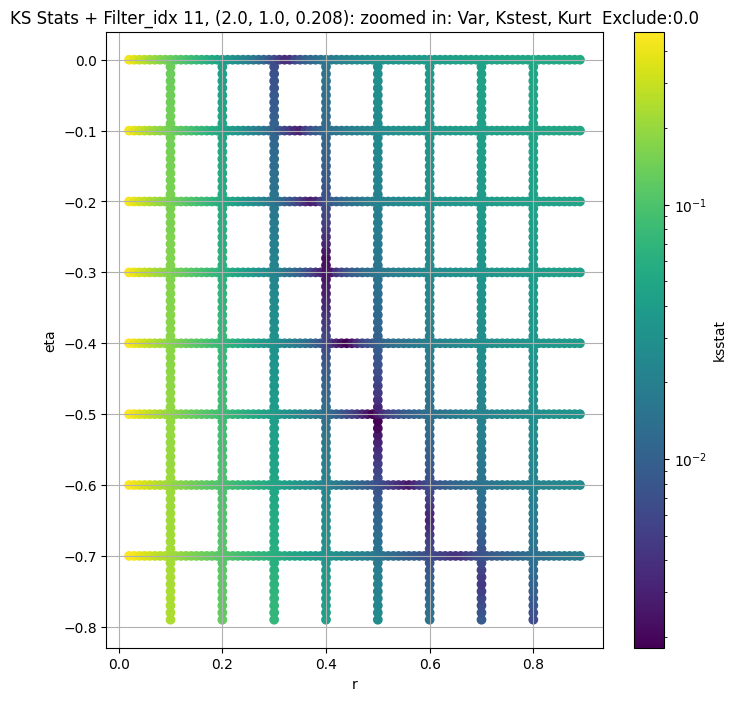

Filter_idx 12, (2.0, 1.0, 0.306):


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 12, 50.0 + 100 = 150, ksstat: 0.004369746088550508, var: 0.48873481154441833


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 12, 50.0 + 75 = 125, ksstat: 0.003950168886818317, var: 0.4954929053783417


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 12, 50.0 + 50 = 100, ksstat: 0.0039071216383330665, var: 0.502876341342926


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 12, 50.0 + 25 = 75, ksstat: 0.003474887160082041, var: 0.5111036896705627


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 12, 50.0 + 0 = 50, ksstat: 0.0033859516839761516, var: 0.5205608606338501


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 12, 50.0 + -25 = 25, ksstat: 0.0026660892390859003, var: 0.5321623086929321


  0%|          | 0/1692 [00:00<?, ?it/s]

Finding Minimum after computing 1692 CDFs
filter_idx 12, 50.0 + -50 = 0, ksstat: 0.002572214147385732, var: 0.5527461171150208
Number of samples: 100000, Without approximation : 16384000.0


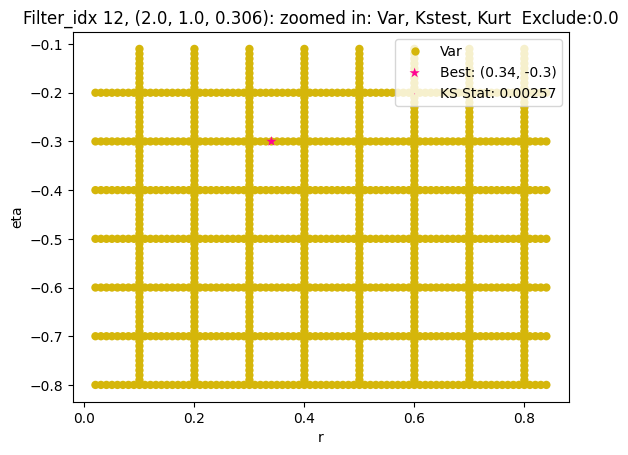

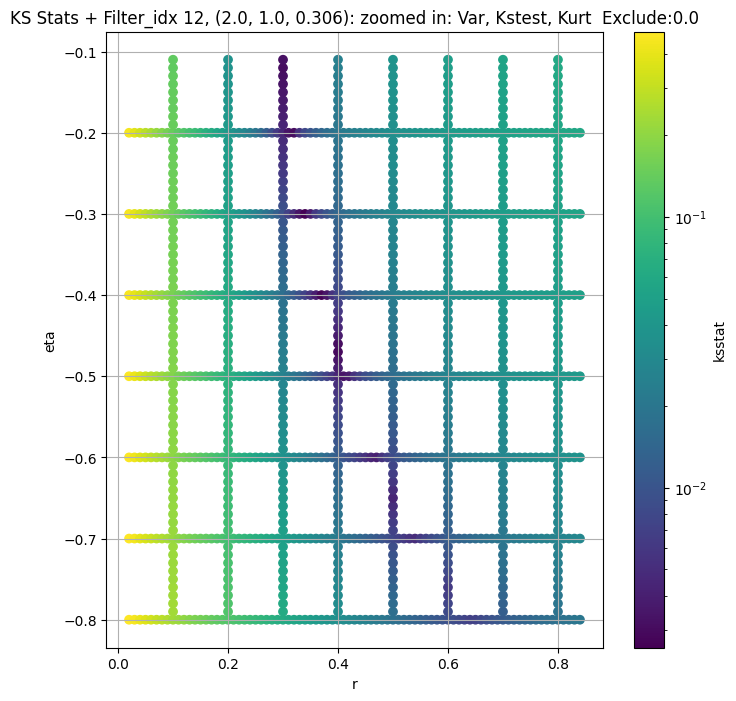

Filter_idx 13, (2.0, 1.0, 0.45):


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 13, 0.0 + 100 = 100, ksstat: 0.00545605877372575, var: 0.16208824515342712


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 13, 0.0 + 75 = 75, ksstat: 0.005159972377008382, var: 0.16517357528209686


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 13, 0.0 + 50 = 50, ksstat: 0.004664241677693685, var: 0.16878698766231537


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 13, 0.0 + 25 = 25, ksstat: 0.003796619088934472, var: 0.17332875728607178


  0%|          | 0/684 [00:00<?, ?it/s]

Finding Minimum after computing 684 CDFs
filter_idx 13, 0.0 + 0 = 0, ksstat: 0.00272398017968975, var: 0.18217843770980835
Number of samples: 100000, Without approximation : 16384000.0


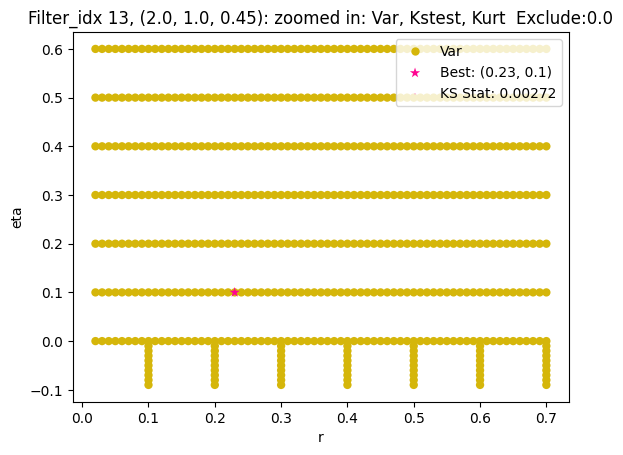

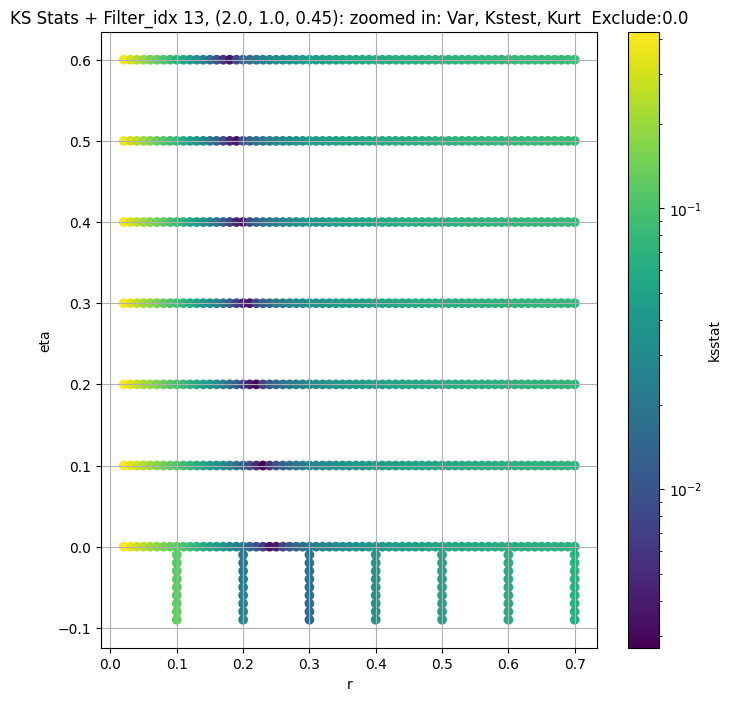

Filter_idx 14, (3.0, 0.5, 0.044):


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 14, 0.0 + 100 = 100, ksstat: 0.002533943479452294, var: 62.83328628540039


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 14, 0.0 + 75 = 75, ksstat: 0.002103901819105247, var: 63.487972259521484


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 14, 0.0 + 50 = 50, ksstat: 0.001651396426212929, var: 64.2199478149414


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 14, 0.0 + 25 = 25, ksstat: 0.0012178283563834824, var: 65.07920837402344


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 14, 0.0 + 0 = 0, ksstat: 0.0006461322044268858, var: 66.36078643798828
Number of samples: 100000, Without approximation : 16384000.0


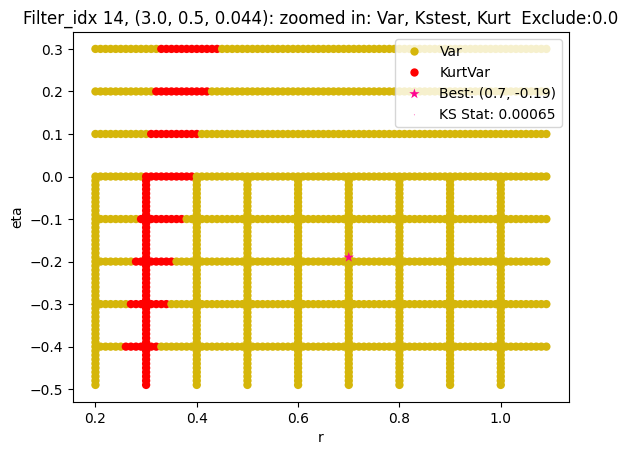

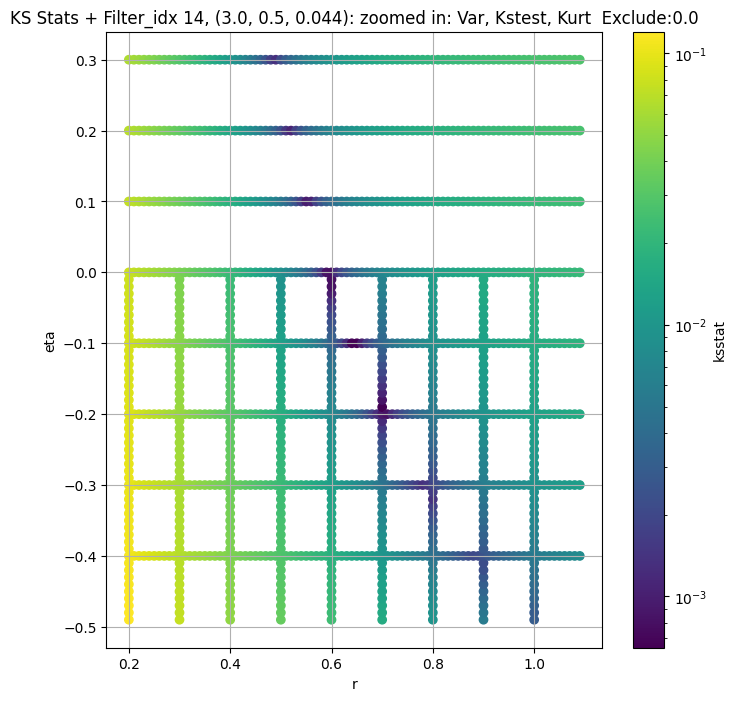

Filter_idx 15, (3.0, 0.5, 0.065):


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 15, 0.0 + 100 = 100, ksstat: 0.00242488081629999, var: 23.264318466186523


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 15, 0.0 + 75 = 75, ksstat: 0.0020131259707529825, var: 23.529632568359375


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 15, 0.0 + 50 = 50, ksstat: 0.0016152863599842963, var: 23.827362060546875


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 15, 0.0 + 25 = 25, ksstat: 0.001133138700555477, var: 24.179237365722656


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 15, 0.0 + 0 = 0, ksstat: 0.0005885124618755233, var: 24.725570678710938
Number of samples: 100000, Without approximation : 16384000.0


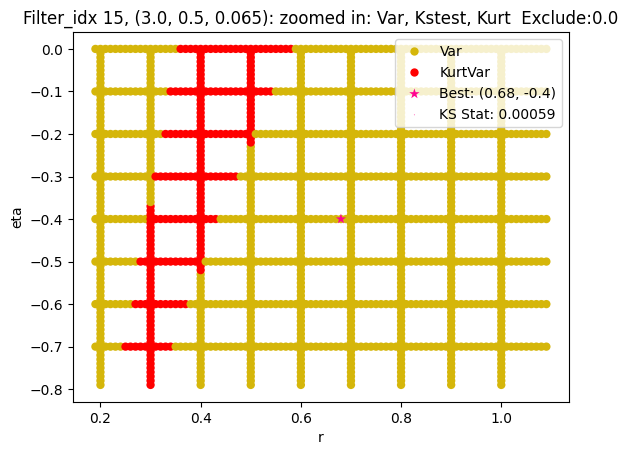

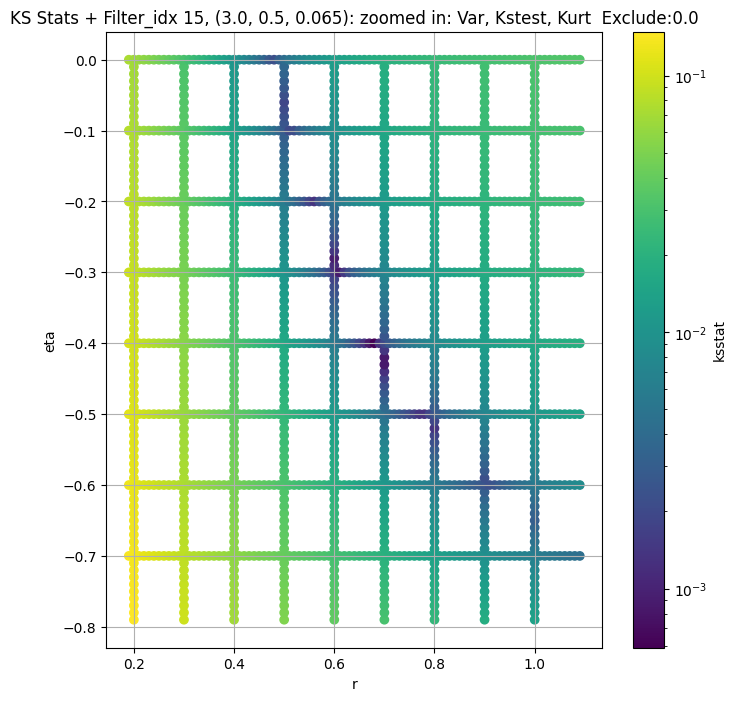

Filter_idx 16, (3.0, 0.5, 0.096):


  0%|          | 0/1701 [00:00<?, ?it/s]

Finding Minimum after computing 1701 CDFs
filter_idx 16, 0.0 + 100 = 100, ksstat: 0.0026207911579580676, var: 8.454383850097656


  0%|          | 0/1701 [00:00<?, ?it/s]

Finding Minimum after computing 1701 CDFs
filter_idx 16, 0.0 + 75 = 75, ksstat: 0.0024643402321626318, var: 8.56108283996582


  0%|          | 0/1701 [00:00<?, ?it/s]

Finding Minimum after computing 1701 CDFs
filter_idx 16, 0.0 + 50 = 50, ksstat: 0.002097588444044618, var: 8.681177139282227


  0%|          | 0/1701 [00:00<?, ?it/s]

Finding Minimum after computing 1701 CDFs
filter_idx 16, 0.0 + 25 = 25, ksstat: 0.0016874978619892955, var: 8.823680877685547


  0%|          | 0/1701 [00:00<?, ?it/s]

Finding Minimum after computing 1701 CDFs
filter_idx 16, 0.0 + 0 = 0, ksstat: 0.0013058083041346258, var: 9.05440902709961
Number of samples: 100000, Without approximation : 16384000.0


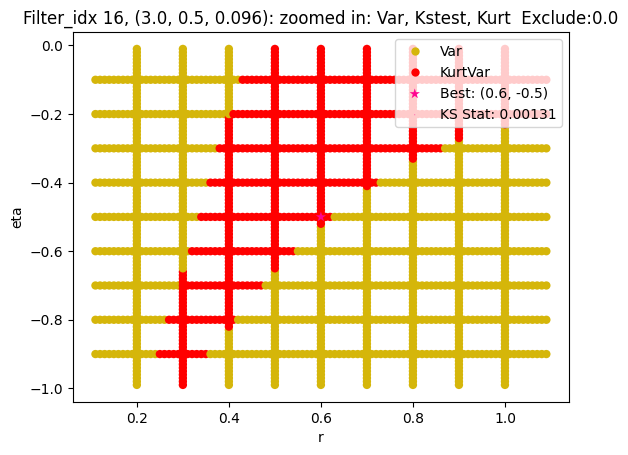

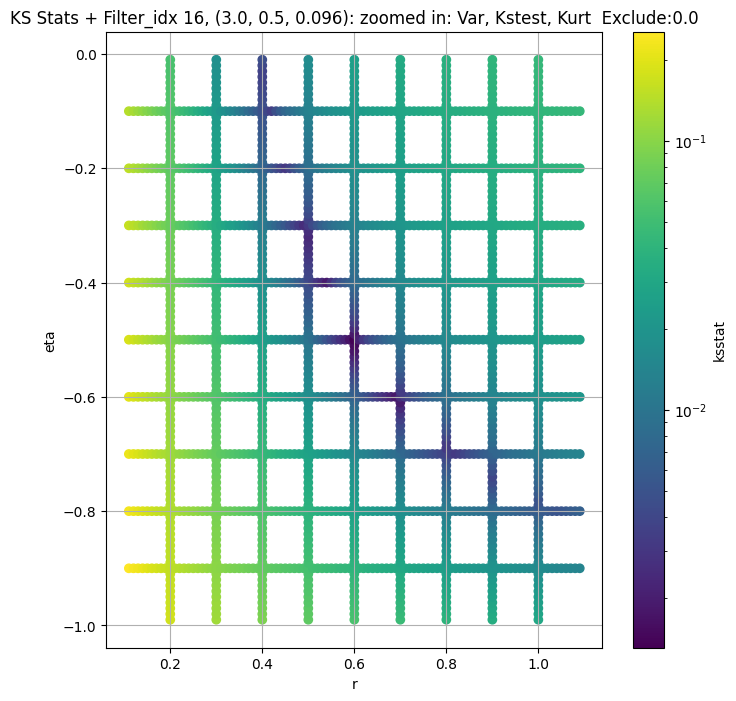

Filter_idx 17, (3.0, 0.5, 0.141):


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 17, 0.0 + 100 = 100, ksstat: 0.0037010081573812803, var: 2.994666814804077


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 17, 0.0 + 75 = 75, ksstat: 0.00345340387081379, var: 3.0355496406555176


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 17, 0.0 + 50 = 50, ksstat: 0.0030869622402687202, var: 3.0816023349761963


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 17, 0.0 + 25 = 25, ksstat: 0.0027638815795758553, var: 3.1363799571990967


  0%|          | 0/1800 [00:00<?, ?it/s]

Finding Minimum after computing 1800 CDFs
filter_idx 17, 0.0 + 0 = 0, ksstat: 0.002434707652096413, var: 3.2259433269500732
Number of samples: 100000, Without approximation : 16384000.0


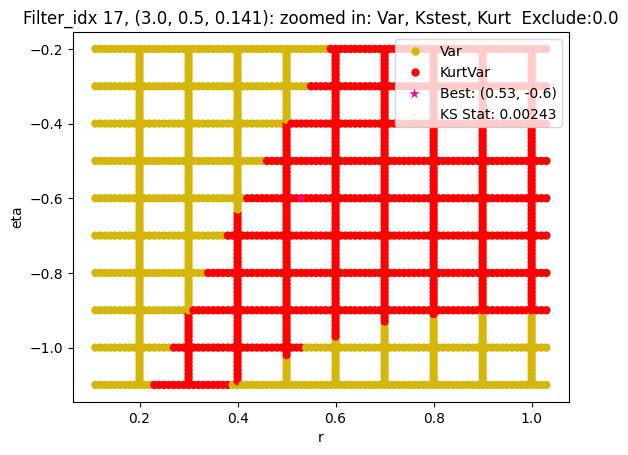

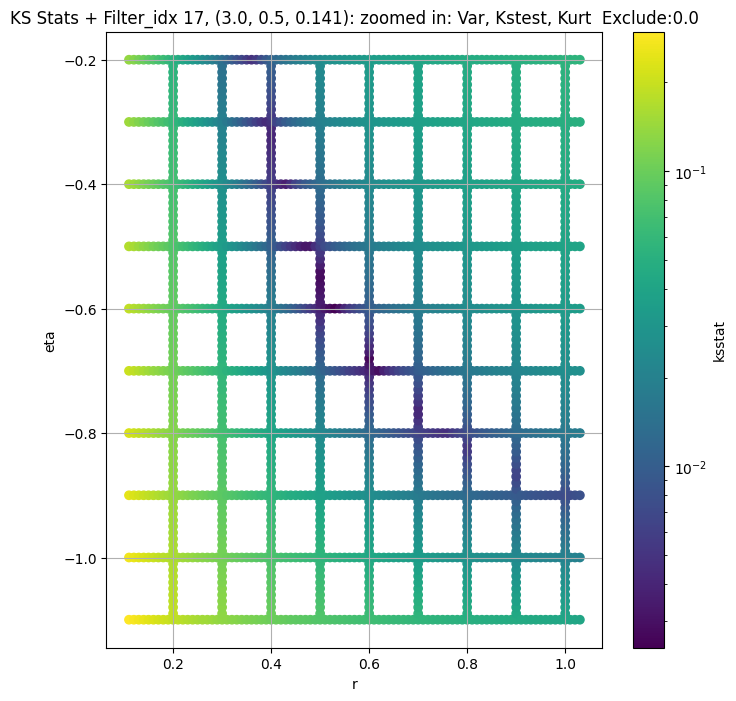

Filter_idx 18, (3.0, 0.5, 0.208):


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 18, 0.0 + 100 = 100, ksstat: 0.005523745363656851, var: 1.0119047164916992


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 18, 0.0 + 75 = 75, ksstat: 0.005060543804362425, var: 1.0280864238739014


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 18, 0.0 + 50 = 50, ksstat: 0.004905312070439483, var: 1.0464836359024048


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 18, 0.0 + 25 = 25, ksstat: 0.004595523579519756, var: 1.0687165260314941


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 18, 0.0 + 0 = 0, ksstat: 0.004153755847841334, var: 1.1075788736343384
Number of samples: 100000, Without approximation : 16384000.0


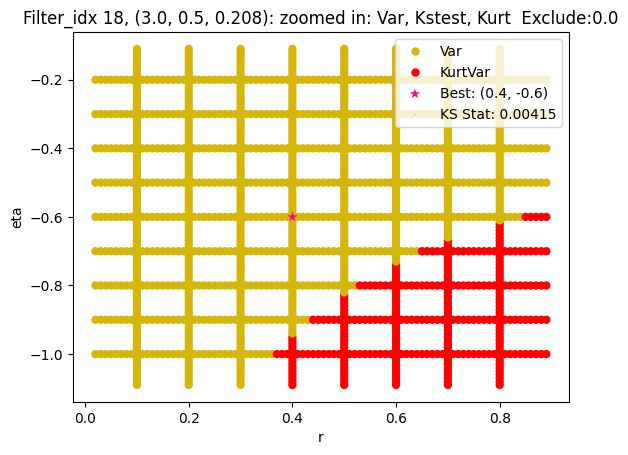

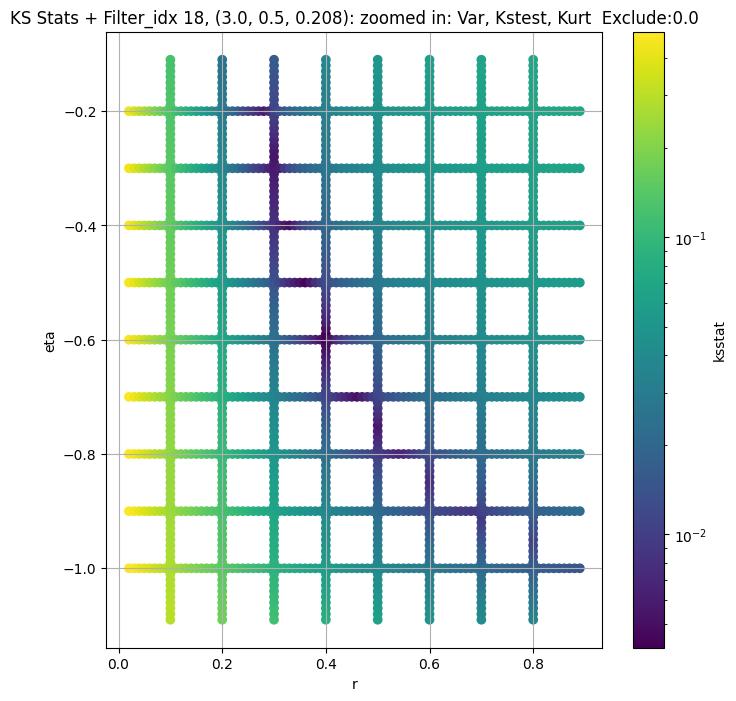

Filter_idx 19, (3.0, 0.5, 0.306):


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 19, 0.0 + 100 = 100, ksstat: 0.006695126987943278, var: 0.27434298396110535


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 19, 0.0 + 75 = 75, ksstat: 0.006185345687829136, var: 0.27945831418037415


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 19, 0.0 + 50 = 50, ksstat: 0.005596414358125697, var: 0.2853354811668396


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 19, 0.0 + 25 = 25, ksstat: 0.005313547573529531, var: 0.29251828789711


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 19, 0.0 + 0 = 0, ksstat: 0.00486808098427708, var: 0.3052547872066498
Number of samples: 100000, Without approximation : 16384000.0


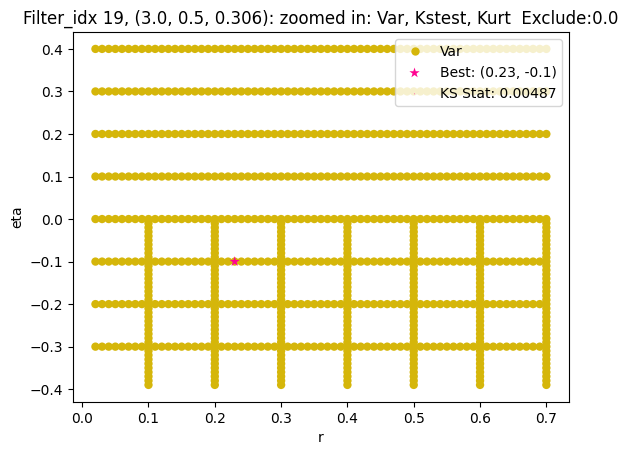

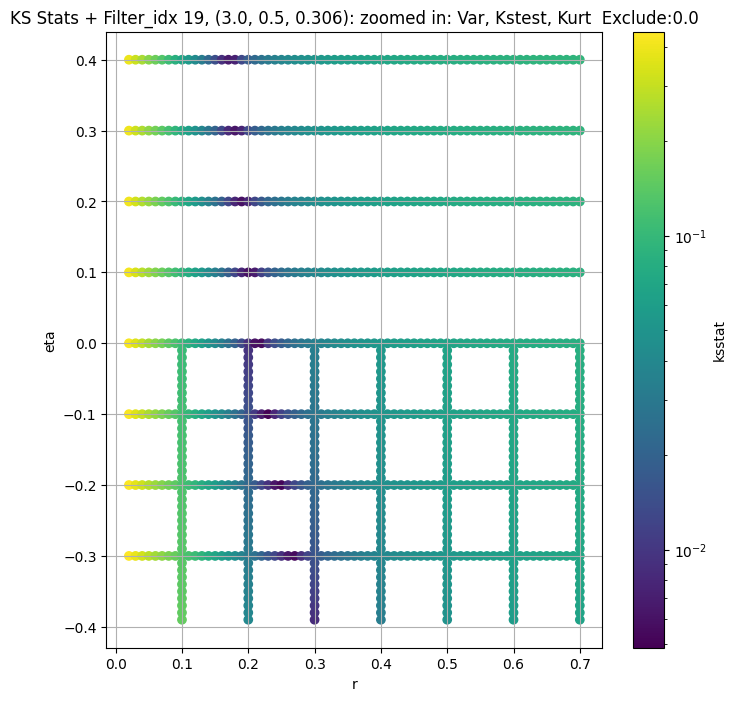

Filter_idx 20, (3.0, 0.5, 0.45):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 20, 0.0 + 100 = 100, ksstat: 0.0065617442335392795, var: 0.07672803848981857


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 20, 0.0 + 75 = 75, ksstat: 0.005956366575185279, var: 0.07845626026391983


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 20, 0.0 + 50 = 50, ksstat: 0.005433911829637039, var: 0.08048833161592484


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 20, 0.0 + 25 = 25, ksstat: 0.004822694021248929, var: 0.08304339647293091


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 20, 0.0 + 0 = 0, ksstat: 0.004346698635531776, var: 0.08817584067583084
Number of samples: 100000, Without approximation : 16384000.0


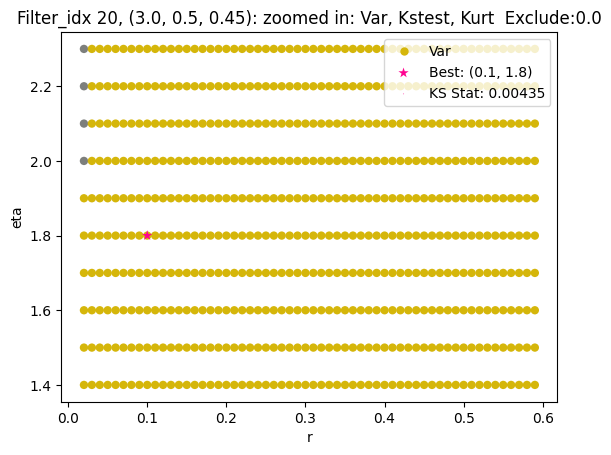

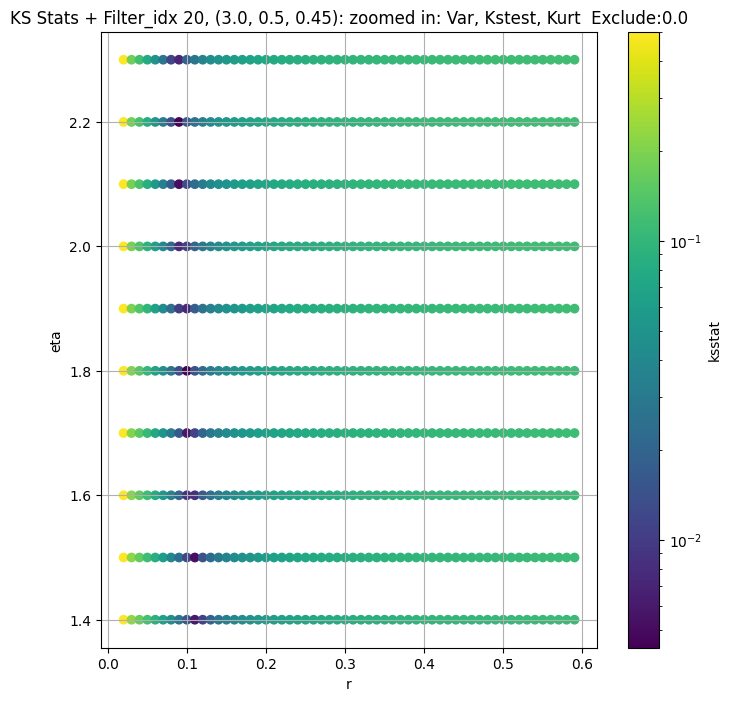

Filter_idx 21, (3.0, 1.0, 0.044):


  0%|          | 0/963 [00:00<?, ?it/s]

Finding Minimum after computing 963 CDFs
filter_idx 21, 0.0 + 100 = 100, ksstat: 0.0023281319628660757, var: 68.05513763427734


  0%|          | 0/963 [00:00<?, ?it/s]

Finding Minimum after computing 963 CDFs
filter_idx 21, 0.0 + 75 = 75, ksstat: 0.0019036798184415143, var: 68.78312683105469


  0%|          | 0/963 [00:00<?, ?it/s]

Finding Minimum after computing 963 CDFs
filter_idx 21, 0.0 + 50 = 50, ksstat: 0.0014074904198153604, var: 69.60083770751953


  0%|          | 0/963 [00:00<?, ?it/s]

Finding Minimum after computing 963 CDFs
filter_idx 21, 0.0 + 25 = 25, ksstat: 0.000843544912827305, var: 70.58094024658203


  0%|          | 0/963 [00:00<?, ?it/s]

Finding Minimum after computing 963 CDFs
filter_idx 21, 0.0 + 0 = 0, ksstat: 0.0007181731041907558, var: 72.09461212158203
Number of samples: 100000, Without approximation : 16384000.0


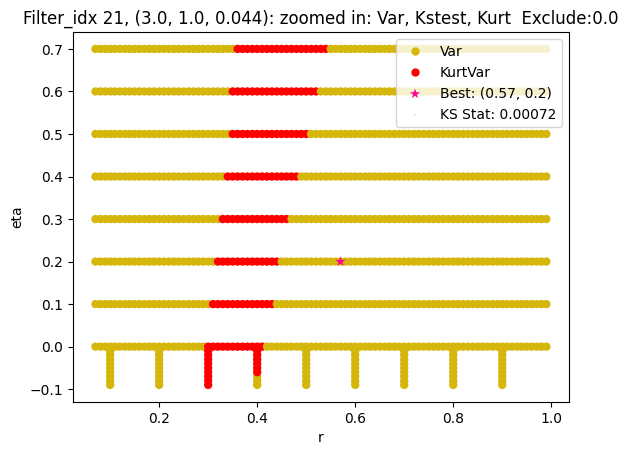

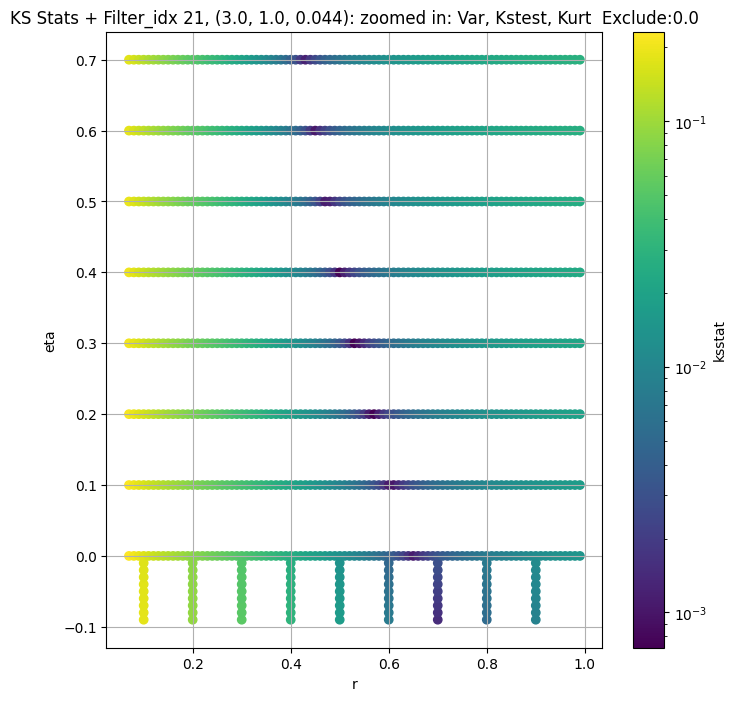

Filter_idx 22, (3.0, 1.0, 0.065):


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 22, 0.0 + 100 = 100, ksstat: 0.0027921266726732563, var: 27.225072860717773


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 22, 0.0 + 75 = 75, ksstat: 0.0022662882743628154, var: 27.554309844970703


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 22, 0.0 + 50 = 50, ksstat: 0.0016643931589644945, var: 27.923860549926758


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 22, 0.0 + 25 = 25, ksstat: 0.0011469368555139248, var: 28.363767623901367


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 22, 0.0 + 0 = 0, ksstat: 0.0002805708433307741, var: 29.068782806396484
Number of samples: 100000, Without approximation : 16384000.0


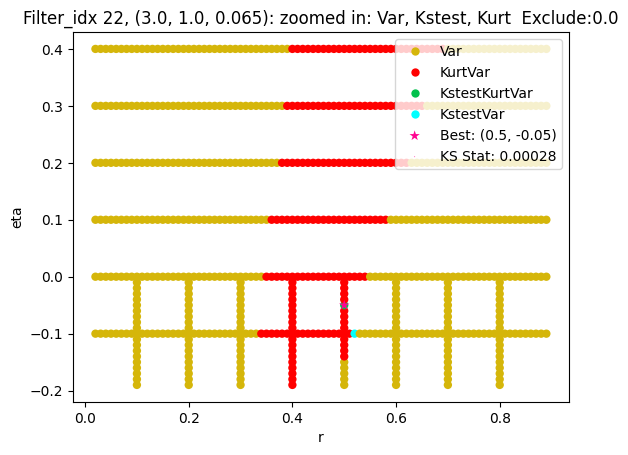

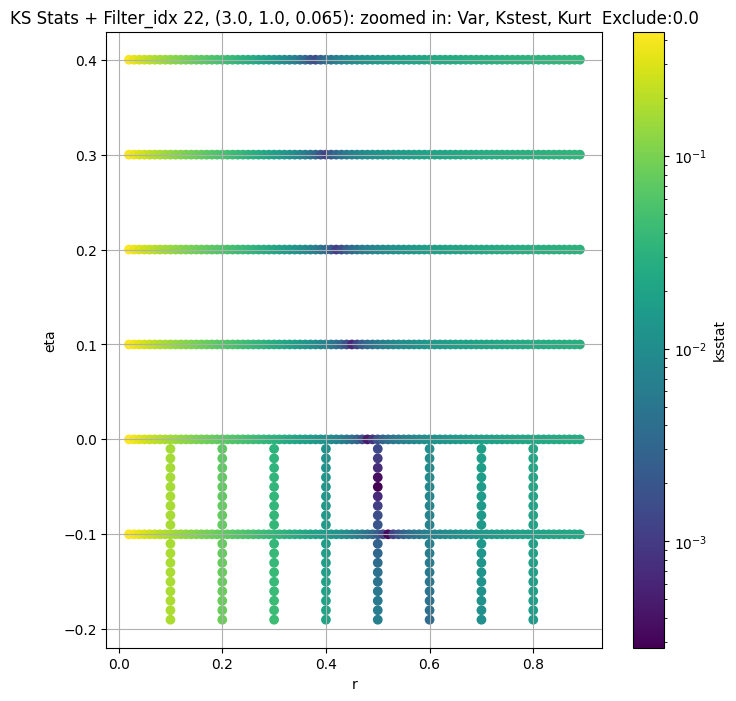

Filter_idx 23, (3.0, 1.0, 0.096):


  0%|          | 0/1611 [00:00<?, ?it/s]

Finding Minimum after computing 1611 CDFs
filter_idx 23, 0.0 + 100 = 100, ksstat: 0.0025301230930681595, var: 9.982349395751953


  0%|          | 0/1611 [00:00<?, ?it/s]

Finding Minimum after computing 1611 CDFs
filter_idx 23, 0.0 + 75 = 75, ksstat: 0.0021442704001889967, var: 10.116345405578613


  0%|          | 0/1611 [00:00<?, ?it/s]

Finding Minimum after computing 1611 CDFs
filter_idx 23, 0.0 + 50 = 50, ksstat: 0.0017742855637591093, var: 10.267587661743164


  0%|          | 0/1611 [00:00<?, ?it/s]

Finding Minimum after computing 1611 CDFs
filter_idx 23, 0.0 + 25 = 25, ksstat: 0.0015532044779910104, var: 10.448046684265137


  0%|          | 0/1611 [00:00<?, ?it/s]

Finding Minimum after computing 1611 CDFs
filter_idx 23, 0.0 + 0 = 0, ksstat: 0.0011022325961362739, var: 10.750367164611816
Number of samples: 100000, Without approximation : 16384000.0


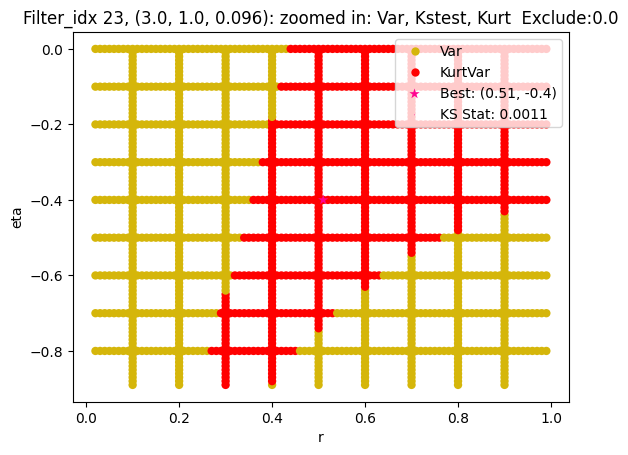

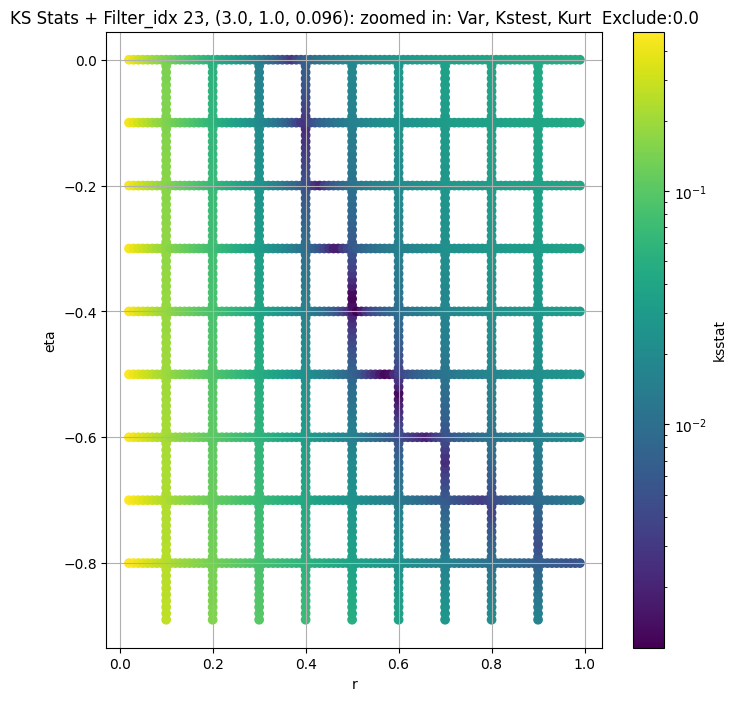

Filter_idx 24, (3.0, 1.0, 0.141):


  0%|          | 0/1440 [00:00<?, ?it/s]

Finding Minimum after computing 1440 CDFs
filter_idx 24, 0.0 + 100 = 100, ksstat: 0.003235871160121029, var: 3.6813812255859375


  0%|          | 0/1440 [00:00<?, ?it/s]

Finding Minimum after computing 1440 CDFs
filter_idx 24, 0.0 + 75 = 75, ksstat: 0.0029866106597563613, var: 3.7369542121887207


  0%|          | 0/1440 [00:00<?, ?it/s]

Finding Minimum after computing 1440 CDFs
filter_idx 24, 0.0 + 50 = 50, ksstat: 0.0025896820290615685, var: 3.800049066543579


  0%|          | 0/1440 [00:00<?, ?it/s]

Finding Minimum after computing 1440 CDFs
filter_idx 24, 0.0 + 25 = 25, ksstat: 0.0022300588706792857, var: 3.8757474422454834


  0%|          | 0/1440 [00:00<?, ?it/s]

Finding Minimum after computing 1440 CDFs
filter_idx 24, 0.0 + 0 = 0, ksstat: 0.0019262603212115703, var: 4.006154537200928
Number of samples: 100000, Without approximation : 16384000.0


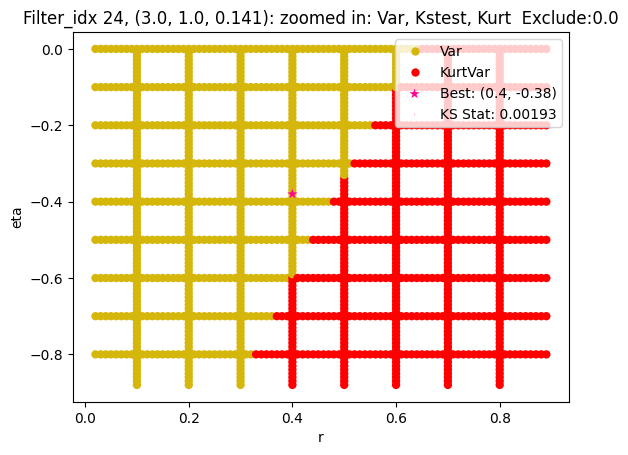

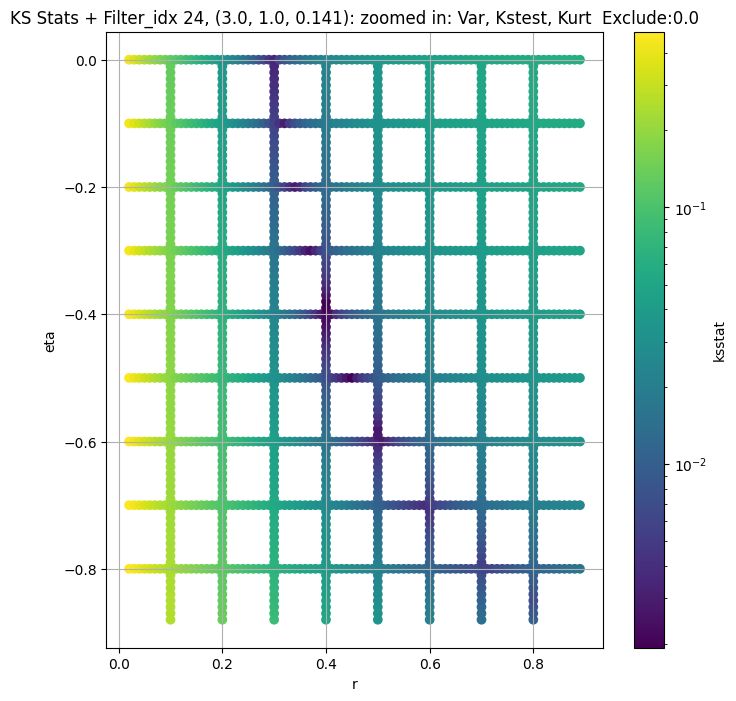

Filter_idx 25, (3.0, 1.0, 0.208):


  0%|          | 0/1206 [00:00<?, ?it/s]

Finding Minimum after computing 1206 CDFs
filter_idx 25, 0.0 + 100 = 100, ksstat: 0.004541129061721931, var: 1.2321994304656982


  0%|          | 0/1206 [00:00<?, ?it/s]

Finding Minimum after computing 1206 CDFs
filter_idx 25, 0.0 + 75 = 75, ksstat: 0.0040618780382356695, var: 1.2535916566848755


  0%|          | 0/1206 [00:00<?, ?it/s]

Finding Minimum after computing 1206 CDFs
filter_idx 25, 0.0 + 50 = 50, ksstat: 0.003745952589331636, var: 1.2780414819717407


  0%|          | 0/1206 [00:00<?, ?it/s]

Finding Minimum after computing 1206 CDFs
filter_idx 25, 0.0 + 25 = 25, ksstat: 0.003306841757127532, var: 1.3076238632202148


  0%|          | 0/1206 [00:00<?, ?it/s]

Finding Minimum after computing 1206 CDFs
filter_idx 25, 0.0 + 0 = 0, ksstat: 0.0031248222664093106, var: 1.3584930896759033
Number of samples: 100000, Without approximation : 16384000.0


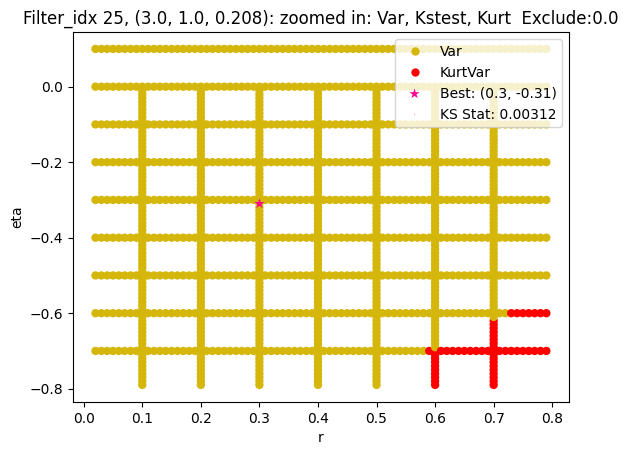

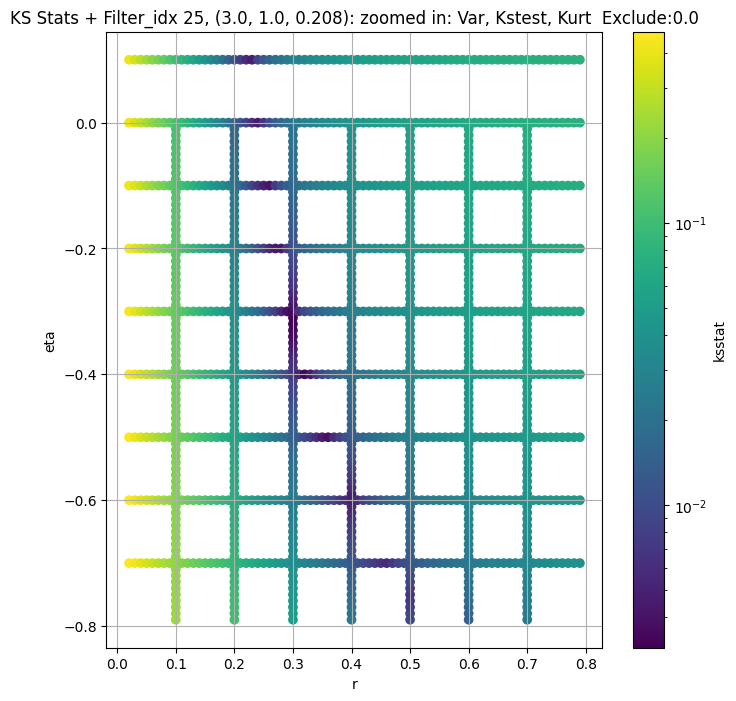

Filter_idx 26, (3.0, 1.0, 0.306):


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 26, 0.0 + 100 = 100, ksstat: 0.005649600369133423, var: 0.35427218675613403


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 26, 0.0 + 75 = 75, ksstat: 0.005081464755459571, var: 0.3613612651824951


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 26, 0.0 + 50 = 50, ksstat: 0.005341073261606877, var: 0.3695695996284485


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 26, 0.0 + 25 = 25, ksstat: 0.0044286236953914315, var: 0.3797243535518646


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 26, 0.0 + 0 = 0, ksstat: 0.003924313900451455, var: 0.3979732096195221
Number of samples: 100000, Without approximation : 16384000.0


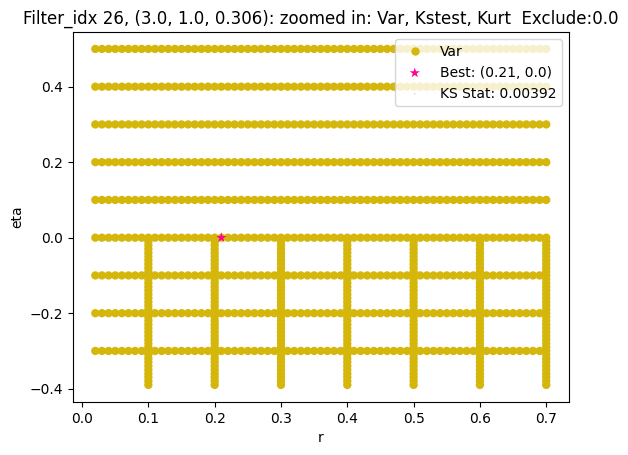

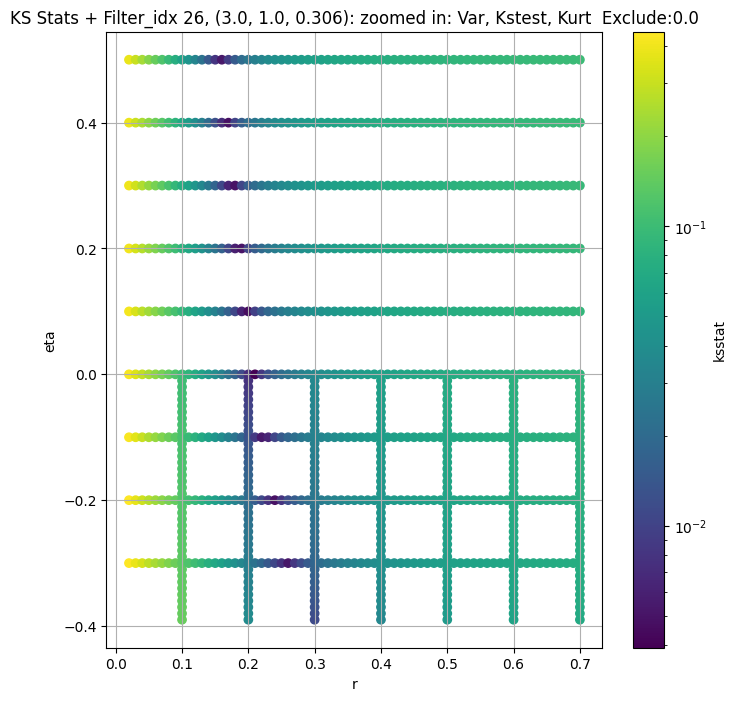

Filter_idx 27, (3.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 100 = 150, ksstat: 0.007289752740779254, var: 0.08000417798757553


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 75 = 125, ksstat: 0.006568547882523049, var: 0.081619493663311


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 50 = 100, ksstat: 0.00629336152746994, var: 0.083415687084198


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 25 = 75, ksstat: 0.005826645586459928, var: 0.08545480668544769


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 0 = 50, ksstat: 0.005284860254777285, var: 0.0878571942448616


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + -25 = 25, ksstat: 0.005176674284558369, var: 0.09097958356142044


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + -50 = 0, ksstat: 0.005791152487467199, var: 0.0977272242307663
Number of samples: 100000, Without approximation : 16384000.0


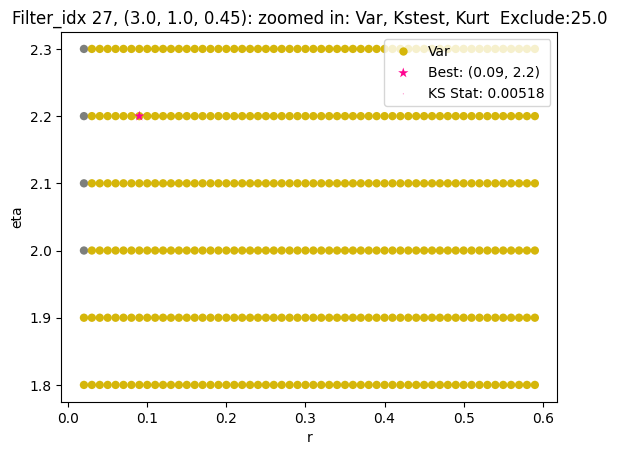

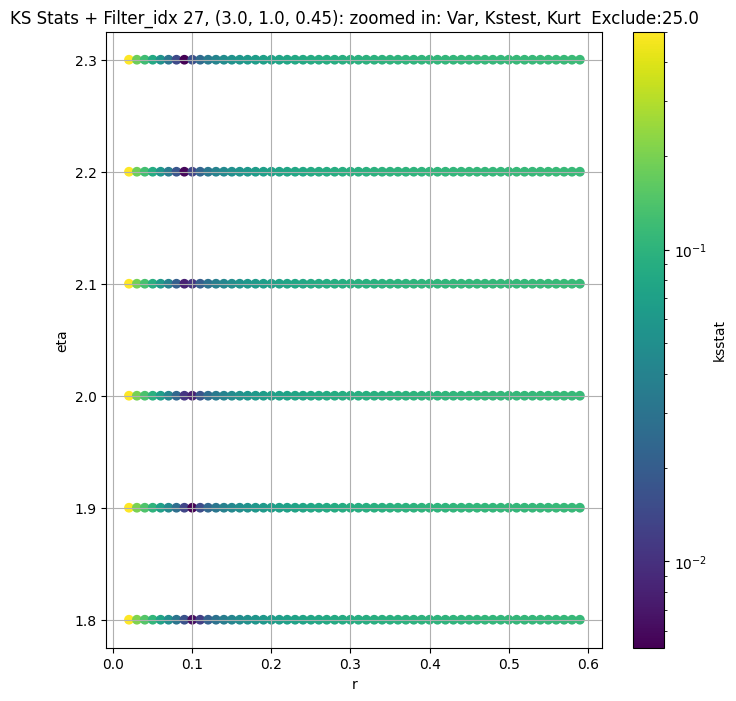

Filter_idx 28, (4.0, 0.5, 0.044):


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 28, 0.0 + 100 = 100, ksstat: 0.00271104772223333, var: 58.81601333618164


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 28, 0.0 + 75 = 75, ksstat: 0.0022274931574008117, var: 59.432952880859375


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 28, 0.0 + 50 = 50, ksstat: 0.0016973977928042491, var: 60.12466812133789


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 28, 0.0 + 25 = 25, ksstat: 0.0010983508164417247, var: 60.9399299621582


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 28, 0.0 + 0 = 0, ksstat: 0.0005853795766327385, var: 62.23569107055664
Number of samples: 100000, Without approximation : 16384000.0


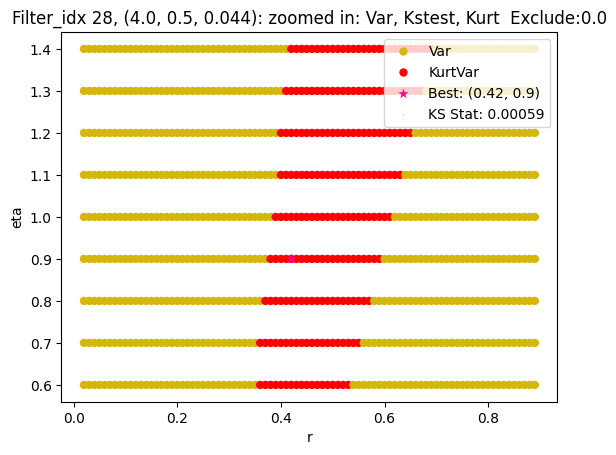

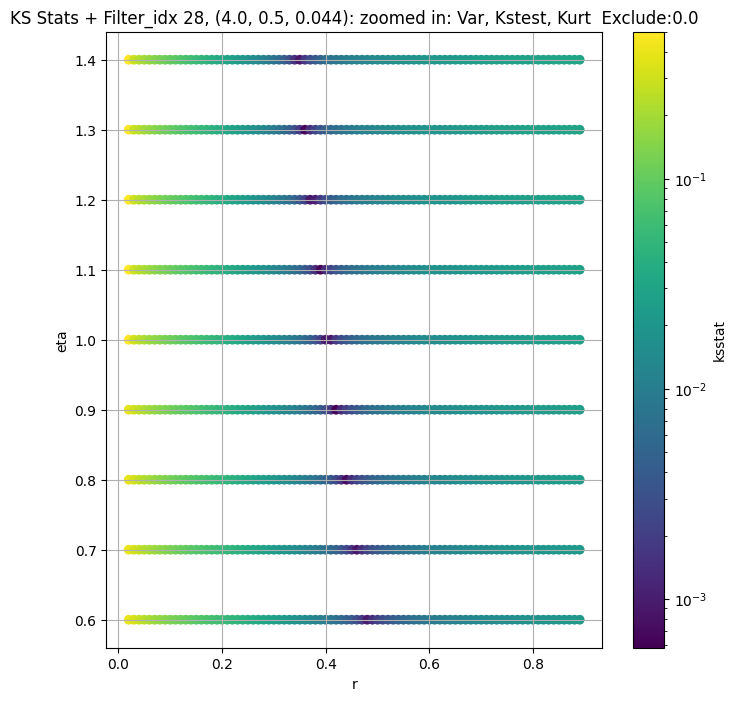

Filter_idx 29, (4.0, 0.5, 0.065):


  0%|          | 0/1377 [00:00<?, ?it/s]

Finding Minimum after computing 1377 CDFs
filter_idx 29, 0.0 + 100 = 100, ksstat: 0.0019664134166480253, var: 22.255661010742188


  0%|          | 0/1377 [00:00<?, ?it/s]

Finding Minimum after computing 1377 CDFs
filter_idx 29, 0.0 + 75 = 75, ksstat: 0.0015800732697281994, var: 22.509891510009766


  0%|          | 0/1377 [00:00<?, ?it/s]

Finding Minimum after computing 1377 CDFs
filter_idx 29, 0.0 + 50 = 50, ksstat: 0.0011755023443138501, var: 22.79766845703125


  0%|          | 0/1377 [00:00<?, ?it/s]

Finding Minimum after computing 1377 CDFs
filter_idx 29, 0.0 + 25 = 25, ksstat: 0.0006832317348779322, var: 23.14149284362793


  0%|          | 0/1377 [00:00<?, ?it/s]

Finding Minimum after computing 1377 CDFs
filter_idx 29, 0.0 + 0 = 0, ksstat: 0.0005443622126611869, var: 23.71347427368164
Number of samples: 100000, Without approximation : 16384000.0


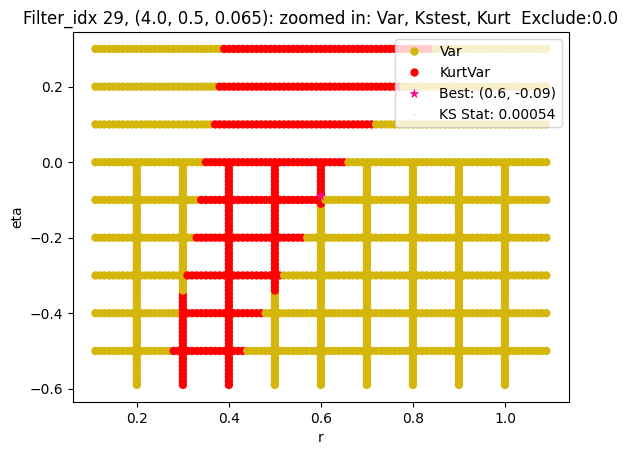

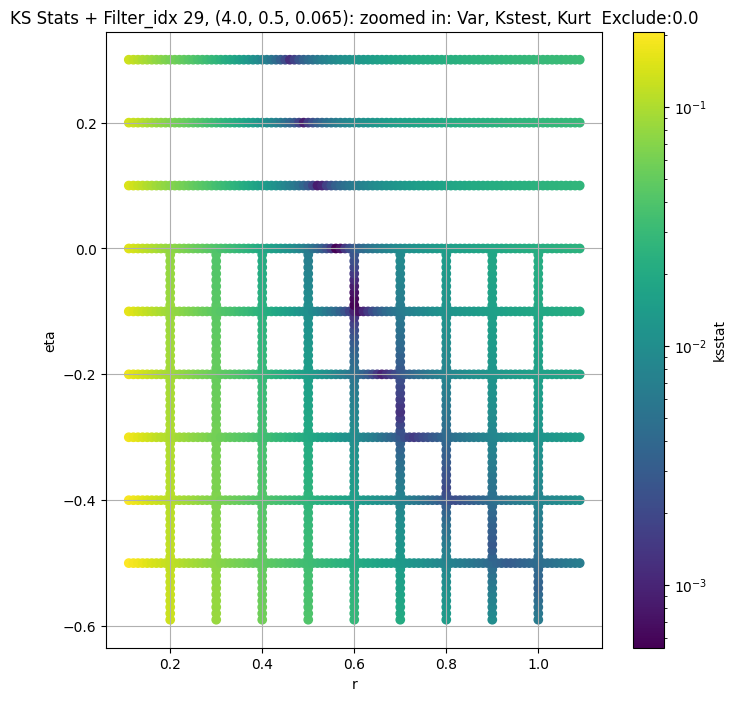

Filter_idx 30, (4.0, 0.5, 0.096):


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 30, 0.0 + 100 = 100, ksstat: 0.0022500172520180106, var: 8.357892990112305


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 30, 0.0 + 75 = 75, ksstat: 0.0018476491273599072, var: 8.46151351928711


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 30, 0.0 + 50 = 50, ksstat: 0.0014430767485870133, var: 8.578282356262207


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 30, 0.0 + 25 = 25, ksstat: 0.0009348871084916555, var: 8.717183113098145


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 30, 0.0 + 0 = 0, ksstat: 0.0003024636122181401, var: 8.964859008789062
Number of samples: 100000, Without approximation : 16384000.0


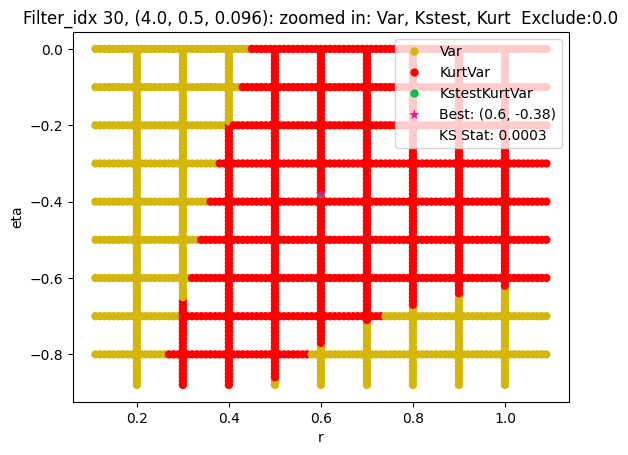

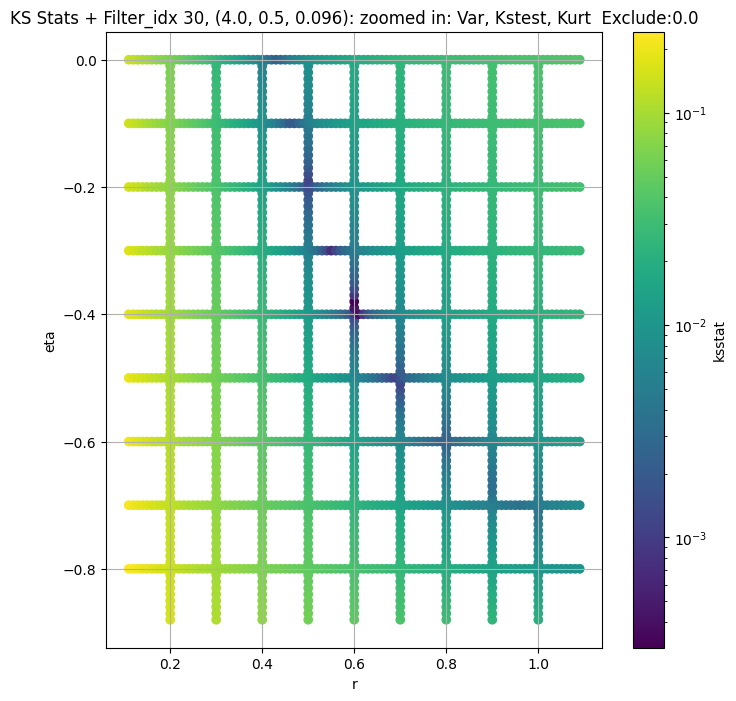

Filter_idx 31, (4.0, 0.5, 0.141):


  0%|          | 0/1701 [00:00<?, ?it/s]

Finding Minimum after computing 1701 CDFs
filter_idx 31, 0.0 + 100 = 100, ksstat: 0.0027048662185954475, var: 2.8911945819854736


  0%|          | 0/1701 [00:00<?, ?it/s]

Finding Minimum after computing 1701 CDFs
filter_idx 31, 0.0 + 75 = 75, ksstat: 0.0024336357586301344, var: 2.930924415588379


  0%|          | 0/1701 [00:00<?, ?it/s]

Finding Minimum after computing 1701 CDFs
filter_idx 31, 0.0 + 50 = 50, ksstat: 0.0020616257800063487, var: 2.9757988452911377


  0%|          | 0/1701 [00:00<?, ?it/s]

Finding Minimum after computing 1701 CDFs
filter_idx 31, 0.0 + 25 = 25, ksstat: 0.0017953581044641842, var: 3.029309034347534


  0%|          | 0/1701 [00:00<?, ?it/s]

Finding Minimum after computing 1701 CDFs
filter_idx 31, 0.0 + 0 = 0, ksstat: 0.0013204683974917808, var: 3.1185290813446045
Number of samples: 100000, Without approximation : 16384000.0


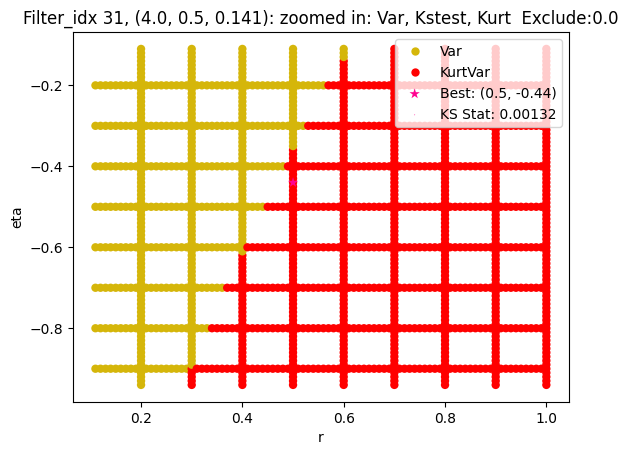

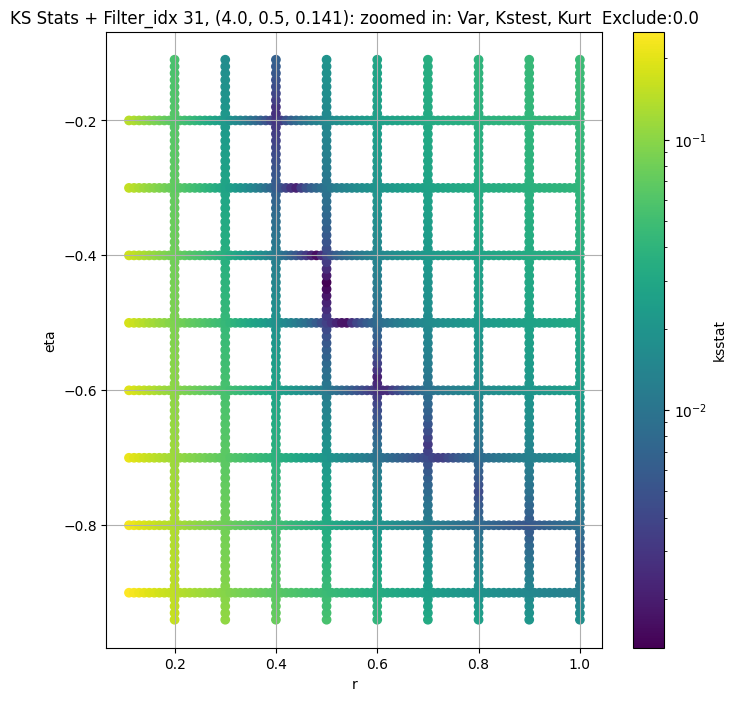

Filter_idx 32, (4.0, 0.5, 0.208):


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 32, 0.0 + 100 = 100, ksstat: 0.0038856914271237428, var: 0.9908864498138428


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 32, 0.0 + 75 = 75, ksstat: 0.003869010763887848, var: 1.006164789199829


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 32, 0.0 + 50 = 50, ksstat: 0.0036179524559049603, var: 1.023476481437683


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 32, 0.0 + 25 = 25, ksstat: 0.0030919767478964078, var: 1.044235110282898


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 32, 0.0 + 0 = 0, ksstat: 0.0028999299802705686, var: 1.0793441534042358
Number of samples: 100000, Without approximation : 16384000.0


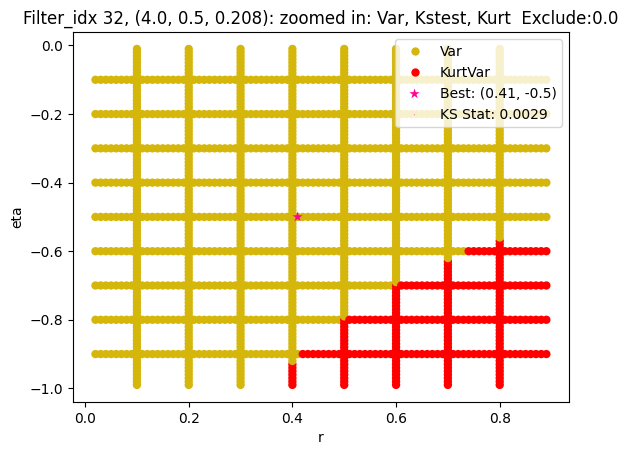

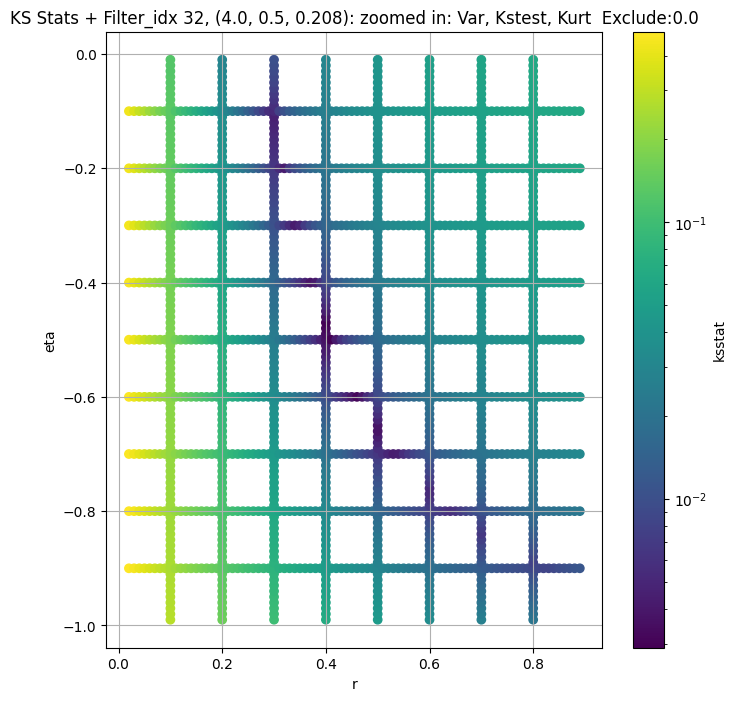

Filter_idx 33, (4.0, 0.5, 0.306):


  0%|          | 0/879 [00:00<?, ?it/s]

Finding Minimum after computing 879 CDFs
filter_idx 33, 0.0 + 100 = 100, ksstat: 0.006003273326363079, var: 0.25714656710624695


  0%|          | 0/879 [00:00<?, ?it/s]

Finding Minimum after computing 879 CDFs
filter_idx 33, 0.0 + 75 = 75, ksstat: 0.005443835199544056, var: 0.26206716895103455


  0%|          | 0/879 [00:00<?, ?it/s]

Finding Minimum after computing 879 CDFs
filter_idx 33, 0.0 + 50 = 50, ksstat: 0.005496434337456502, var: 0.2677276134490967


  0%|          | 0/879 [00:00<?, ?it/s]

Finding Minimum after computing 879 CDFs
filter_idx 33, 0.0 + 25 = 25, ksstat: 0.004796653008311225, var: 0.2746555805206299


  0%|          | 0/879 [00:00<?, ?it/s]

Finding Minimum after computing 879 CDFs
filter_idx 33, 0.0 + 0 = 0, ksstat: 0.0037544816684492166, var: 0.28677913546562195
Number of samples: 100000, Without approximation : 16384000.0


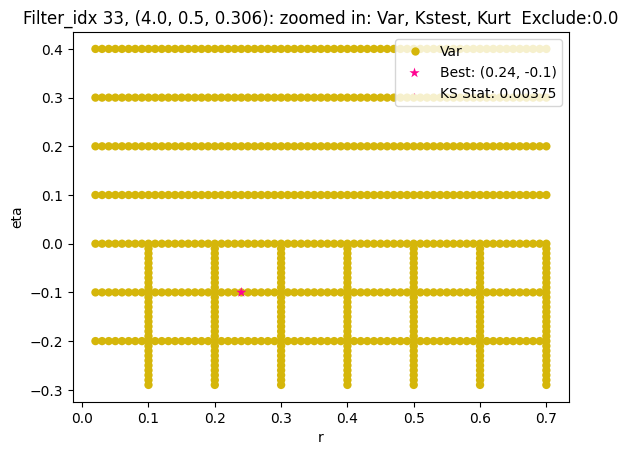

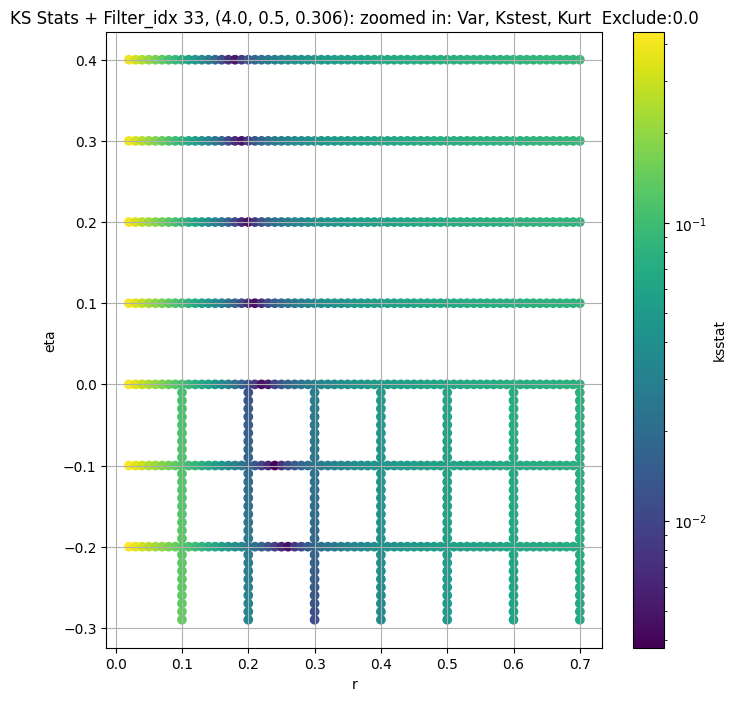

Filter_idx 34, (4.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 100 = 150, ksstat: 0.006313508337528688, var: 0.05340446159243584


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 75 = 125, ksstat: 0.0060648734265109985, var: 0.05447235703468323


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 50 = 100, ksstat: 0.005413217410576654, var: 0.05565714091062546


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 25 = 75, ksstat: 0.004842338648404443, var: 0.057002391666173935


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 0 = 50, ksstat: 0.004693041985699975, var: 0.05859622359275818


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + -25 = 25, ksstat: 0.005149065902683381, var: 0.06064634025096893


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + -50 = 0, ksstat: 0.006414799006168315, var: 0.06482475250959396
Number of samples: 100000, Without approximation : 16384000.0


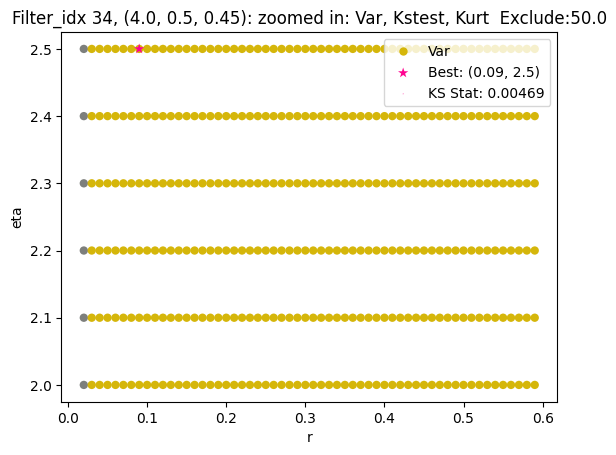

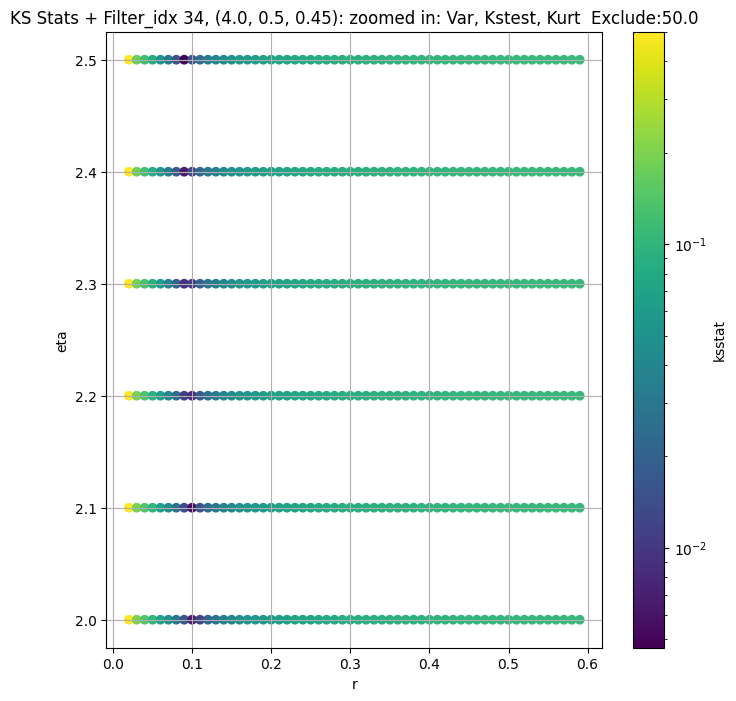

Filter_idx 35, (4.0, 1.0, 0.044):


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 35, 0.0 + 100 = 100, ksstat: 0.002595036435602549, var: 64.81610870361328


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 35, 0.0 + 75 = 75, ksstat: 0.002117664718074397, var: 65.48123931884766


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 35, 0.0 + 50 = 50, ksstat: 0.0016061718747863163, var: 66.22205352783203


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 35, 0.0 + 25 = 25, ksstat: 0.0010371866665062068, var: 67.08805084228516


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 35, 0.0 + 0 = 0, ksstat: 0.0004205554832459324, var: 68.34272003173828
Number of samples: 100000, Without approximation : 16384000.0


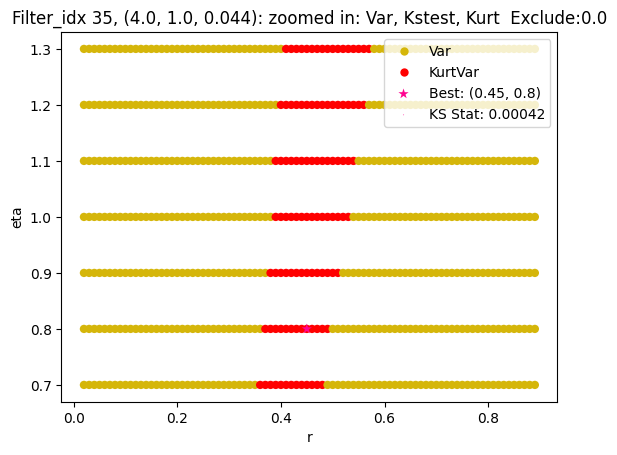

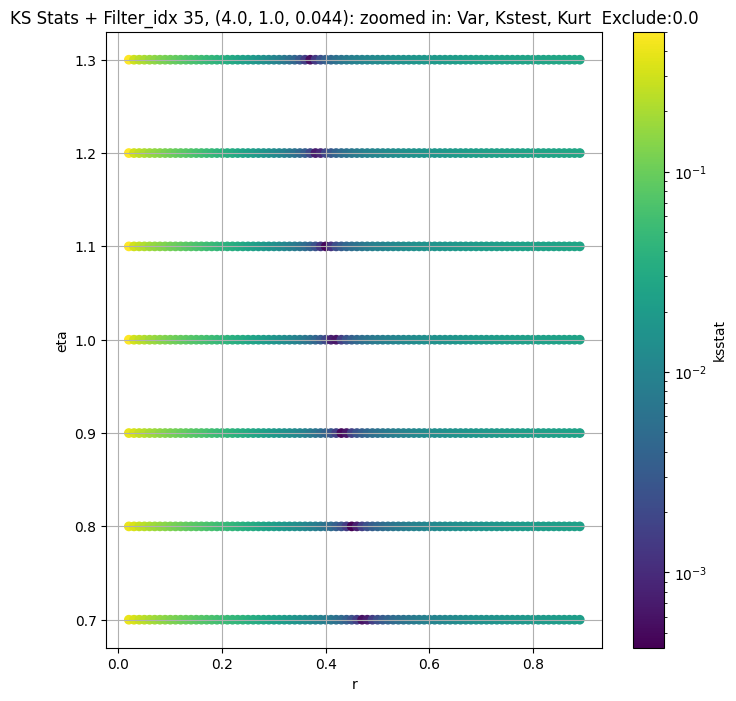

Filter_idx 36, (4.0, 1.0, 0.065):


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 36, 50.0 + 100 = 150, ksstat: 0.002547269066627795, var: 23.982805252075195


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 36, 50.0 + 75 = 125, ksstat: 0.0021858044159146495, var: 24.230796813964844


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 36, 50.0 + 50 = 100, ksstat: 0.0017963068225908228, var: 24.499753952026367


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 36, 50.0 + 25 = 75, ksstat: 0.0013852747467081317, var: 24.79720115661621


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 36, 50.0 + 0 = 50, ksstat: 0.0009814949451431455, var: 25.136547088623047


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 36, 50.0 + -25 = 25, ksstat: 0.0005484451943901479, var: 25.54633903503418


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 36, 50.0 + -50 = 0, ksstat: 0.0007335068879045503, var: 26.207284927368164
Number of samples: 100000, Without approximation : 16384000.0


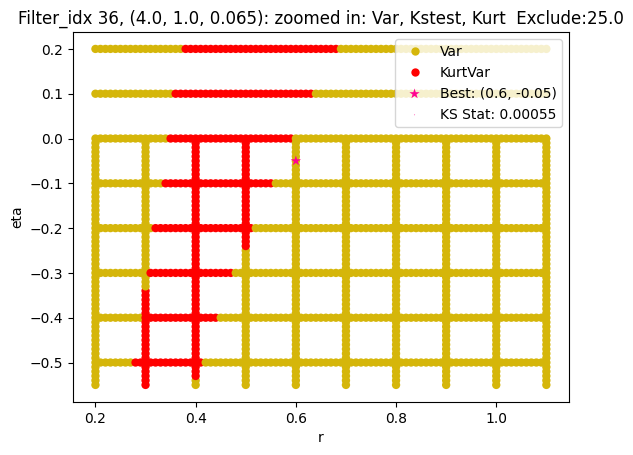

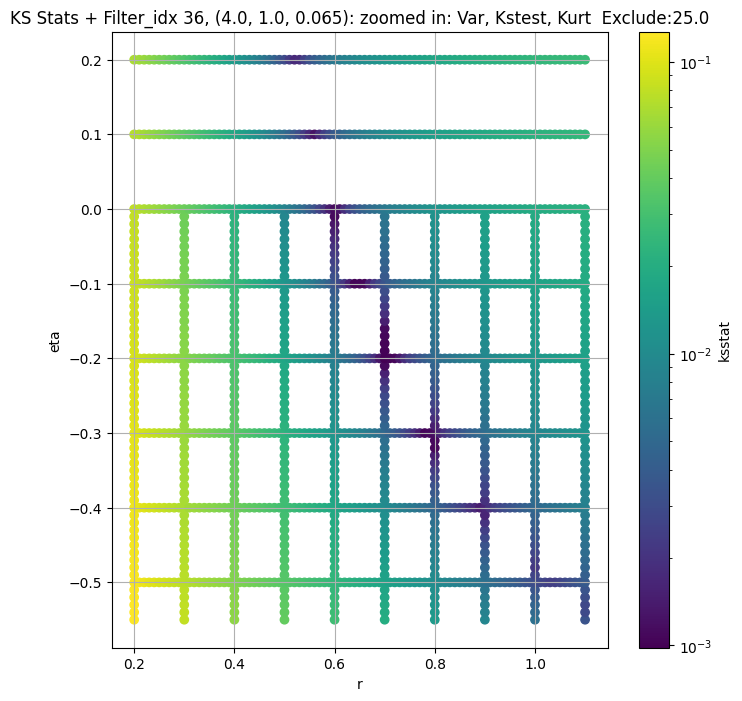

Filter_idx 37, (4.0, 1.0, 0.096):


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 37, 50.0 + 100 = 150, ksstat: 0.0028277216958917384, var: 8.458134651184082


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 37, 50.0 + 75 = 125, ksstat: 0.0024512179291706, var: 8.554163932800293


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 37, 50.0 + 50 = 100, ksstat: 0.0020517191294591175, var: 8.658491134643555


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 37, 50.0 + 25 = 75, ksstat: 0.0016641010613768076, var: 8.773958206176758


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 37, 50.0 + 0 = 50, ksstat: 0.0012524657554046081, var: 8.906244277954102


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 37, 50.0 + -25 = 25, ksstat: 0.0007491872632685581, var: 9.068324089050293


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 37, 50.0 + -50 = 0, ksstat: 0.0005254212593671093, var: 9.351094245910645
Number of samples: 100000, Without approximation : 16384000.0


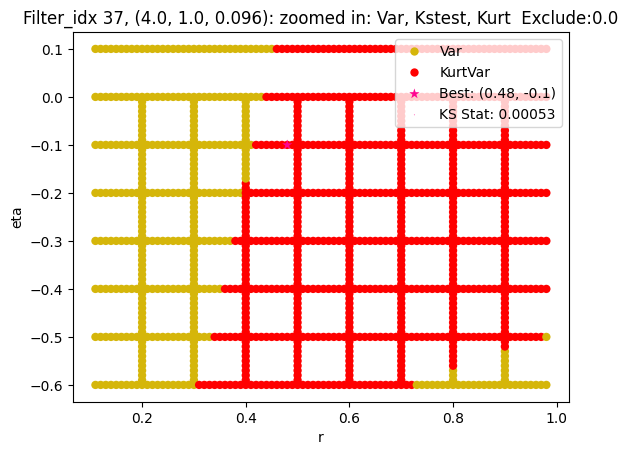

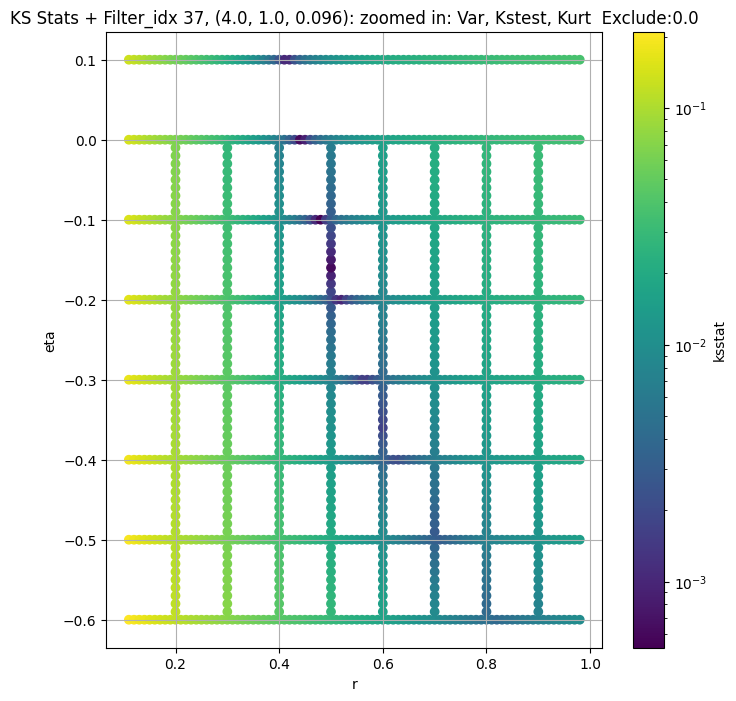

Filter_idx 38, (4.0, 1.0, 0.141):


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 38, 0.0 + 100 = 100, ksstat: 0.002503578169063235, var: 3.146364688873291


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 38, 0.0 + 75 = 75, ksstat: 0.0020933936337194092, var: 3.1952362060546875


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 38, 0.0 + 50 = 50, ksstat: 0.0017260639596686778, var: 3.251488447189331


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 38, 0.0 + 25 = 25, ksstat: 0.001400609447026982, var: 3.320394992828369


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 38, 0.0 + 0 = 0, ksstat: 0.0008727210744677305, var: 3.442379951477051
Number of samples: 100000, Without approximation : 16384000.0


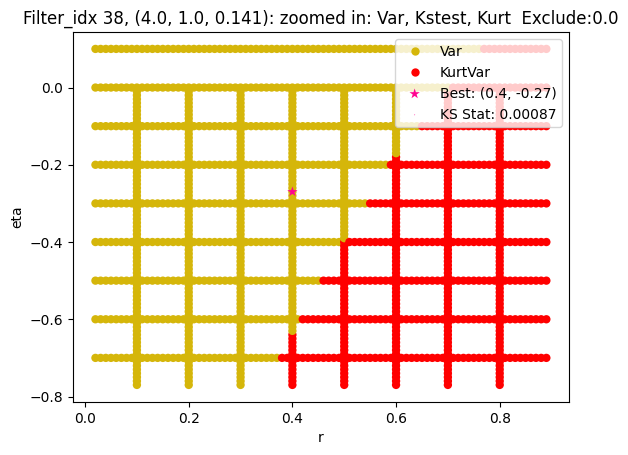

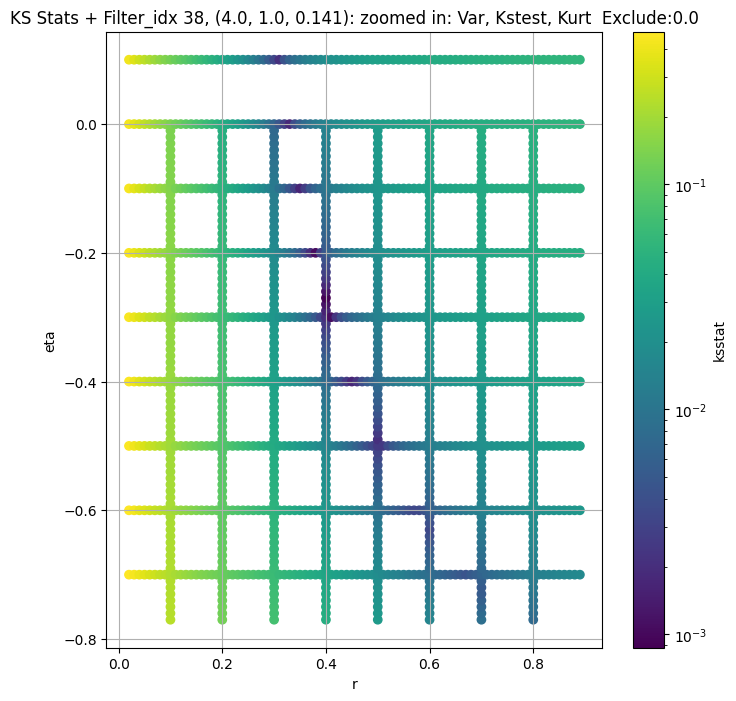

Filter_idx 39, (4.0, 1.0, 0.208):


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 39, 50.0 + 100 = 150, ksstat: 0.004267656981063128, var: 1.01862370967865


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 39, 50.0 + 75 = 125, ksstat: 0.004093298830443848, var: 1.0339527130126953


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 39, 50.0 + 50 = 100, ksstat: 0.003743674267147834, var: 1.050701379776001


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 39, 50.0 + 25 = 75, ksstat: 0.0035895512311870936, var: 1.0693374872207642


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 39, 50.0 + 0 = 50, ksstat: 0.0031049307239330304, var: 1.0907855033874512


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 39, 50.0 + -25 = 25, ksstat: 0.0028725697637019265, var: 1.1172326803207397


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 39, 50.0 + -50 = 0, ksstat: 0.002099833372089202, var: 1.1672104597091675
Number of samples: 100000, Without approximation : 16384000.0


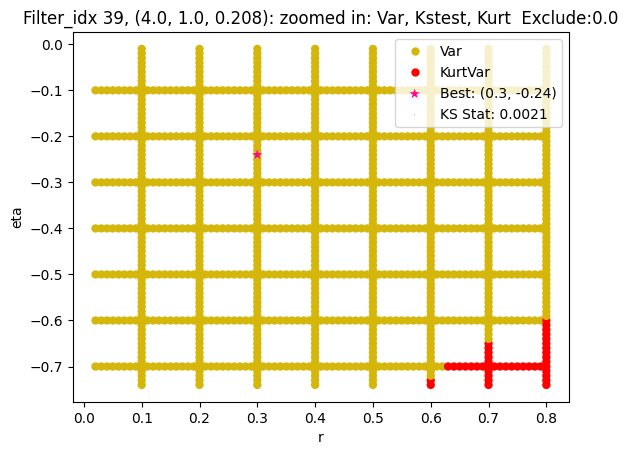

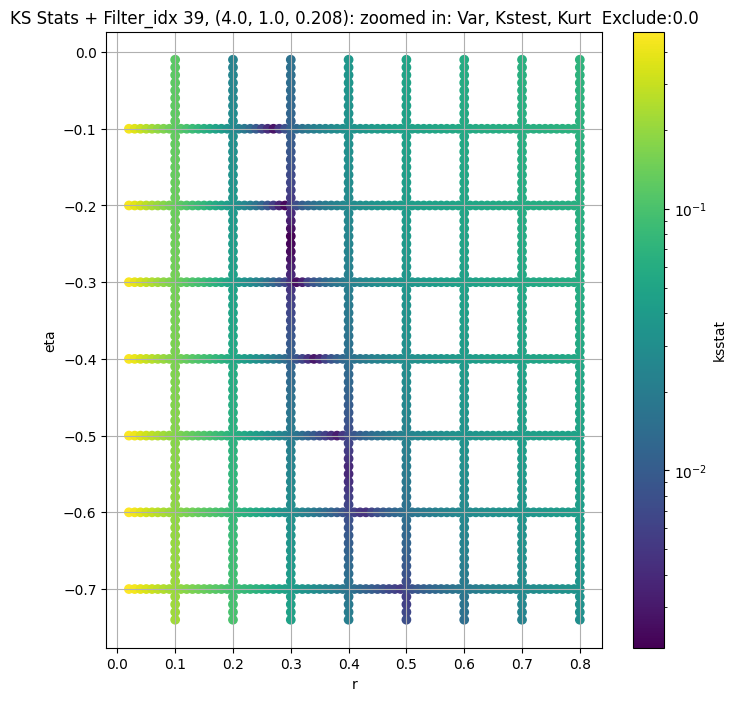

Filter_idx 40, (4.0, 1.0, 0.306):


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 40, 0.0 + 100 = 100, ksstat: 0.004751132729696628, var: 0.30536898970603943


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 40, 0.0 + 75 = 75, ksstat: 0.00476059655786986, var: 0.3116995692253113


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 40, 0.0 + 50 = 50, ksstat: 0.004634245074919718, var: 0.3190322816371918


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 40, 0.0 + 25 = 25, ksstat: 0.0039742337750033885, var: 0.32811295986175537


  0%|          | 0/873 [00:00<?, ?it/s]

Finding Minimum after computing 873 CDFs
filter_idx 40, 0.0 + 0 = 0, ksstat: 0.003959533635957024, var: 0.34554895758628845
Number of samples: 100000, Without approximation : 16384000.0


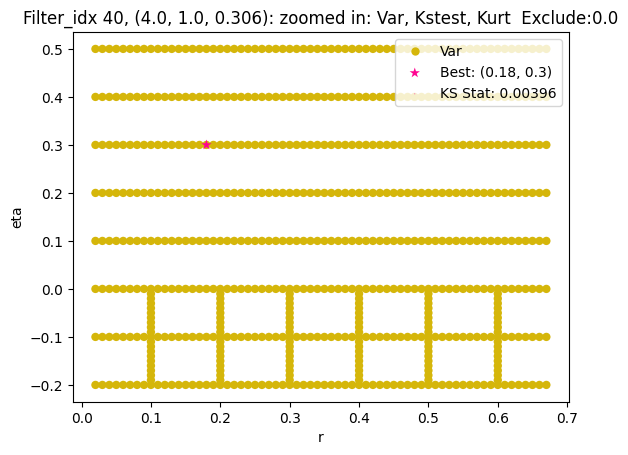

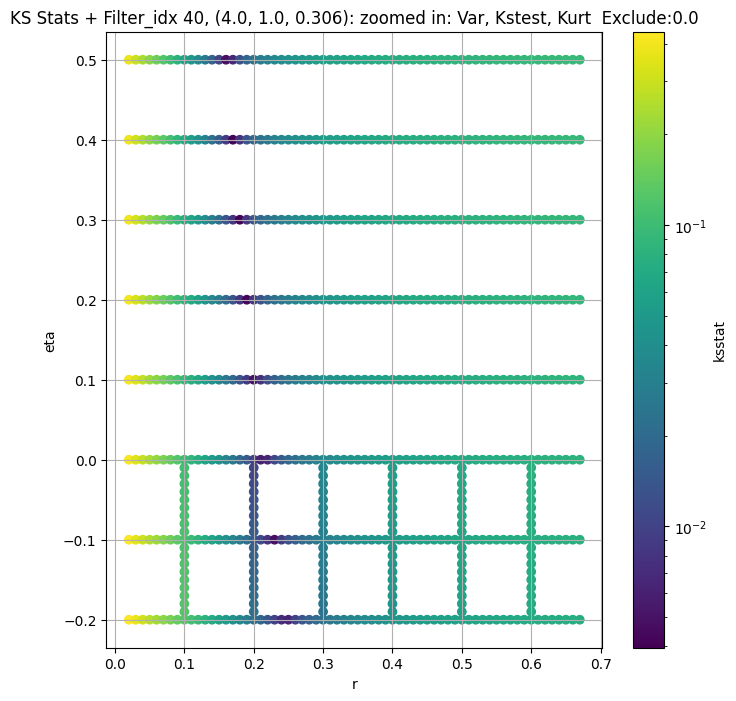

Filter_idx 41, (4.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 100.0 + 100 = 200, ksstat: 0.006023388065192682, var: 0.053797341883182526


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 100.0 + 75 = 175, ksstat: 0.005752185577047625, var: 0.05486087128520012


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 100.0 + 50 = 150, ksstat: 0.0051160443167235226, var: 0.05601895600557327


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 100.0 + 25 = 125, ksstat: 0.004629450402005686, var: 0.05729253962635994


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 100.0 + 0 = 100, ksstat: 0.004707151560289863, var: 0.058715324848890305


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 100.0 + -25 = 75, ksstat: 0.005230651566135669, var: 0.06034494563937187


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 100.0 + -50 = 50, ksstat: 0.006003954084107366, var: 0.062295347452163696


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 100.0 + -75 = 25, ksstat: 0.006337921303751548, var: 0.06482317298650742


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 100.0 + -100 = 0, ksstat: 0.007255233552250218, var: 0.07088186591863632
Number of samples: 100000, Without approximation : 16384000.0


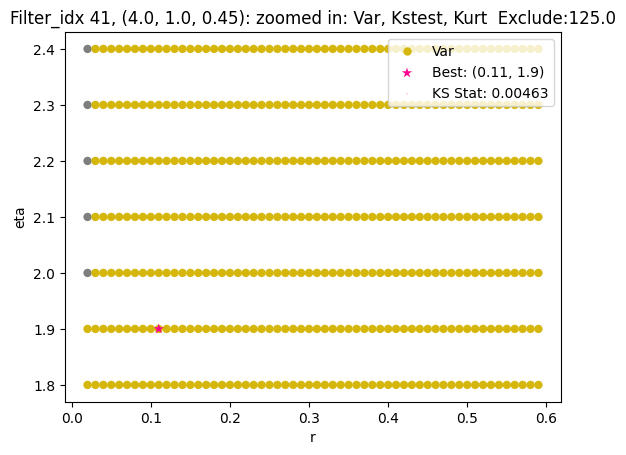

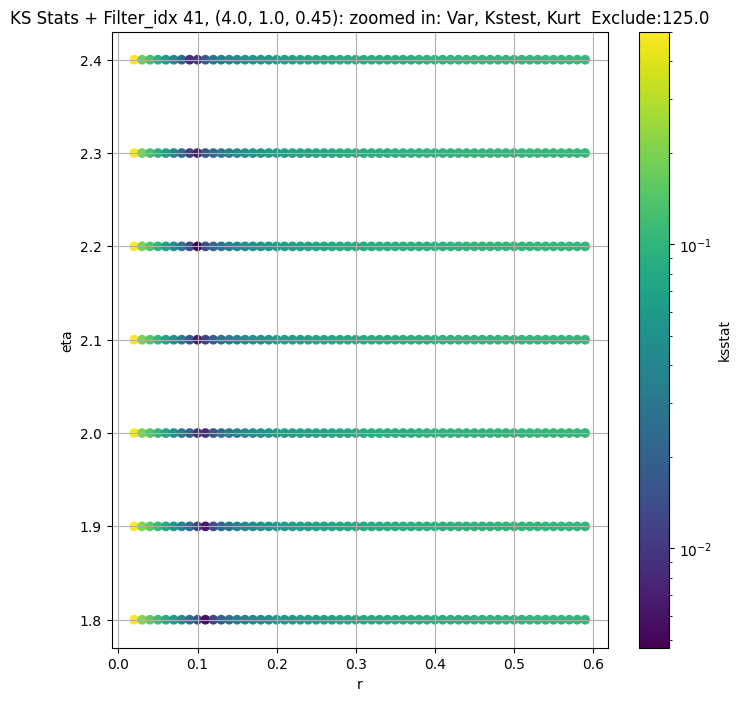

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff,n_pval_0.05
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",66.027500,54.146038,78.471810,2.872609,1.310862,8.945055,16384000.0,"(2.0, 0.5, 0.044)",0.000828,...,9.789326e+00,0.0,66.027496,0.000336,0.000625,0.65,0.10,1.424371e+01,0.0,4608000
1,"(2.0, 0.5, 0.065)",26.310843,21.517254,32.023525,3.199361,1.414631,9.393432,16384000.0,"(2.0, 0.5, 0.065)",0.001469,...,5.221121e+00,0.0,26.310843,0.000336,0.000816,0.74,-0.30,1.208497e+01,0.0,2916000
2,"(2.0, 0.5, 0.096)",9.566076,7.822888,11.649402,4.244763,1.784425,15.088311,16384000.0,"(2.0, 0.5, 0.096)",0.001272,...,4.815516e+00,0.0,9.566076,0.000336,0.000608,0.70,-0.48,4.694737e+00,0.0,5184000
3,"(2.0, 0.5, 0.141)",3.654214,2.947185,4.602266,5.157766,2.219726,21.337349,16384000.0,"(2.0, 0.5, 0.141)",0.002600,...,3.091608e+00,50.0,3.654214,0.000336,0.001730,0.64,-0.60,1.667625e+00,0.0,648000
4,"(2.0, 0.5, 0.208)",1.246894,0.973456,1.553282,6.502080,2.953488,27.303137,16384000.0,"(2.0, 0.5, 0.208)",0.003327,...,2.473995e-01,0.0,1.246894,0.000336,0.002860,0.51,-0.60,2.676841e-01,0.0,216000
5,"(2.0, 0.5, 0.306)",0.311960,0.240554,0.415629,9.978146,3.126065,66.287040,16384000.0,"(2.0, 0.5, 0.306)",0.004355,...,1.113877e-03,0.0,0.311960,0.000336,0.003560,0.35,-0.40,5.955489e-03,0.0,144000
6,"(2.0, 0.5, 0.45)",0.174408,0.132992,0.256785,11.664751,3.498166,98.722450,16384000.0,"(2.0, 0.5, 0.45)",0.004301,...,6.227368e-04,0.0,0.174408,0.000336,0.003660,0.35,-0.40,3.329544e-03,0.0,144000
7,"(2.0, 1.0, 0.044)",87.427610,73.475105,104.673020,3.099155,1.374583,9.448888,16384000.0,"(2.0, 1.0, 0.044)",0.000620,...,1.635287e-02,0.0,87.427612,0.000336,0.000572,0.29,2.20,9.881364e-03,0.0,5832000
8,"(2.0, 1.0, 0.065)",35.733710,29.532925,43.861973,3.527104,1.554718,10.987603,16384000.0,"(2.0, 1.0, 0.065)",0.001197,...,3.711114e-01,0.0,35.733711,0.000336,0.000747,0.46,0.40,1.244941e+00,0.0,3456000


In [ ]:
master_df_optimized_path = Path(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))

NUM_ITERS = dict(zip(GROUPS, [1]*len(GROUPS))) # By default, does one iteration per group
NUM_SAMPLES_OPTIMIZE = 2000
EXCLUDE_CUTOFFS_OPTIMIZE = np.arange(100, -101, -25)

if RERUN or not master_df_optimized_path.exists():

    if SKIP_OPTIMIZE_STEP:

        master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
        master_df[f'best_r'] = master_df['initial_r']
        master_df[f'best_eta'] = master_df['initial_eta']
        master_df[f'best_scale'] = master_df['initial_scale']
        master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

    else:
        for group in GROUPS: # TODO For quick testing purposes
            print(f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}:")
            master_df.loc[group, 'kstest_stat_best'] = master_df.loc[group, 'kstest_stat_initial']
            master_df.loc[group, 'best_r'] = master_df.loc[group, 'initial_r']
            master_df.loc[group, 'best_eta'] = master_df.loc[group, 'initial_eta']
            master_df.loc[group, 'best_scale'] = master_df.loc[group, 'initial_scale']

            sample = group_data_map[group]
            if len(sample) == 0:
                continue
            initial_r, initial_eta = master_df.loc[group, 'initial_r'], master_df.loc[group, f'initial_eta']
            eps = 0.5
            group_cdfs_df = fine_cdfs_df[(np.abs(master_df.loc[group, 'initial_r'] - fine_cdfs_df['r']) < eps) & 
                                        (np.abs(master_df.loc[group, 'initial_eta'] - fine_cdfs_df['eta']) < eps)].reset_index(drop=True)
            group_cdfs = {x[0]:x[1] for x in group_cdfs_df['(r,eta),cdf']}

            for adjust_exclude_cutoff in EXCLUDE_CUTOFFS_OPTIMIZE: # -50, -25, 0, 25, 50
                
                exclude_cutoff = int(max(0, adjust_exclude_cutoff + master_df.loc[group, 'initial_exclude_cutoff']))
                
                if exclude_cutoff == 0:
                    augmented_var = np.var(group_data_map[group])
                else:
                    augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])                       

                group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
                ksstats, initial_param, min_stat = gridsearch(sample, group_cdfs, debug=True, scales=group_cdfs_df['scale'])
                
                cutoff_label = generate_cutoff_label(adjust_exclude_cutoff)

                augmented_var_df.loc[group, f"kstest_stat_{cutoff_label}"] = min_stat
                group_cdfs_df[f'ksstat_exclude_{cutoff_label}'] = ksstats
                
                print(f"{GROUP} {group}, {master_df.loc[group, 'initial_exclude_cutoff']} + {adjust_exclude_cutoff} = {exclude_cutoff}, ksstat: {min_stat}, var: {augmented_var}")
                best_adjust = 0

                if min_stat < master_df.loc[group, 'kstest_stat_best']:

                    inital_min_stat = min_stat
                    inital_best_param = initial_param
                    master_df.loc[group, 'kstest_stat_best'] = min_stat
                    initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                    master_df.loc[group, 'best_r'], master_df.loc[group, 'best_eta'] = initial_param
                    master_df.loc[group, 'best_scale'] = initial_scale
                    master_df.loc[group, 'best_exclude_cutoff'] = exclude_cutoff
                    master_df.loc[group, 'best_augmented_var'] = augmented_var
                    augmented_var_df.loc[group, 'best_augmented_var'] = augmented_var
                    best_adjust = adjust_exclude_cutoff

                if exclude_cutoff == 0:
                    break

            cutoff_label = generate_cutoff_label(best_adjust)
            ksstats = group_cdfs_df[f"ksstat_exclude_{cutoff_label}"]
            
            print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
            
            cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
            master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

            best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

            group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
            group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

            group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

            group_dict = rEtaKsstats_dict[group]
            group_dict.update({'r_optimize' : group_cdfs_df['r'], 'eta_optimize' : group_cdfs_df['eta'], f'ksstat_exclude_{cutoff_label}' : ksstats})
            rEtaKsstats_dict[group] = group_dict

            cols = ['pass_var', 'pass_kstest', 'pass_kurt']
            fig = combo_test_plot(group_cdfs_df, cols, 
                                plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: zoomed in: {', '.join([col[5:].capitalize() for col in cols])}  Exclude:{master_df.loc[group, 'best_exclude_cutoff']}",
                                best_param=(master_df.loc[group, 'best_r'], master_df.loc[group, f'best_eta']),
                                best_ksstat=master_df.loc[group, 'kstest_stat_best'])
            fig.figure.savefig(os.path.join(CWD, "plots", f"optimized_full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)
            
    master_df['n_pval_0.05'] = master_df.apply(lambda row : find_n_fixed_pval_stat(row.loc['kstest_stat_best'], row.loc['total_samples']), axis = 1)    
    master_df[['total_samples', 'initial_r', 'initial_eta', 'kstest_stat_initial', 'initial_exclude_cutoff', 'best_r', 'best_eta', 'best_scale', 'kstest_stat_best', 'best_exclude_cutoff', 'n_pval_0.05']].to_csv(os.path.join(CWD, "CSVs", 'optimized_params.csv'))
    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))
    augmented_var_df.to_csv(augmented_var_df_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)

rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df = pd.read_csv(master_df_optimized_path, index_col = GROUP)
augmented_var_df = pd.read_csv(augmented_var_df_path, index_col = GROUP)
master_df

## Comparing Empirical and Computed CDF/PDF

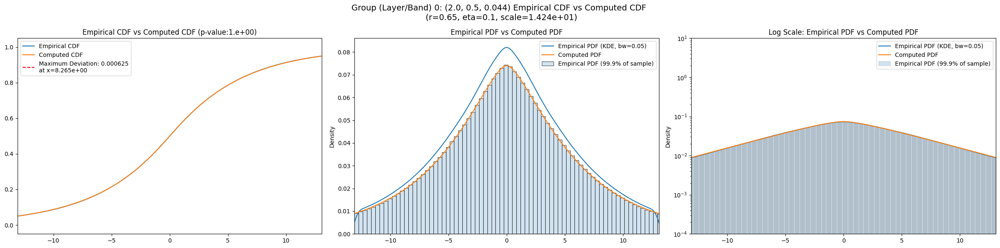

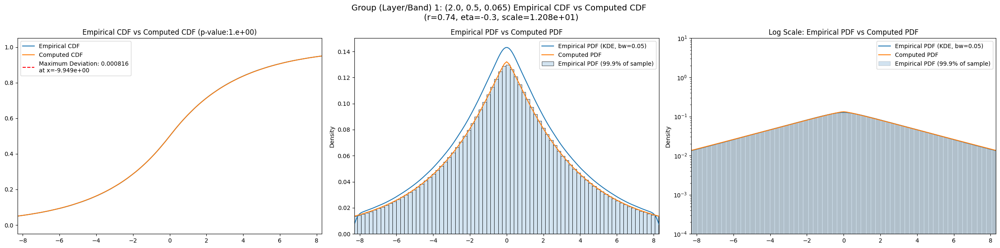

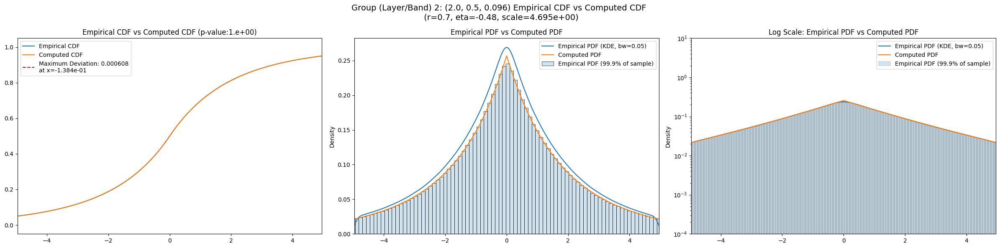

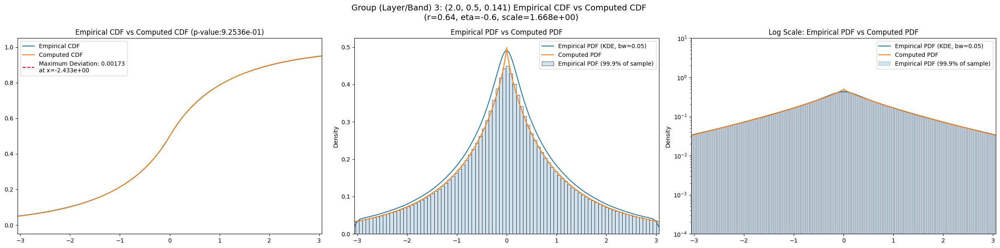

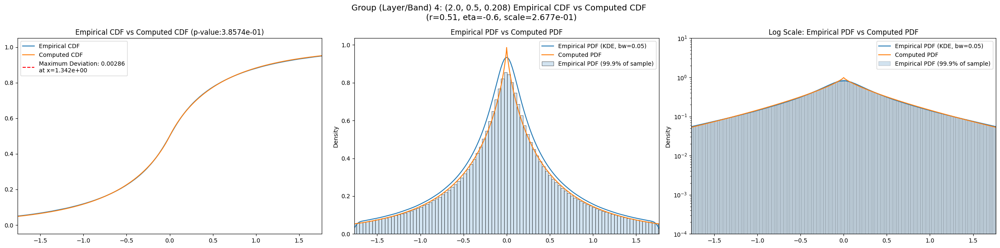

...

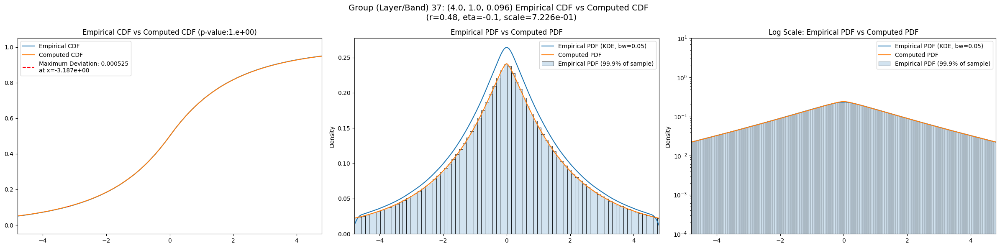

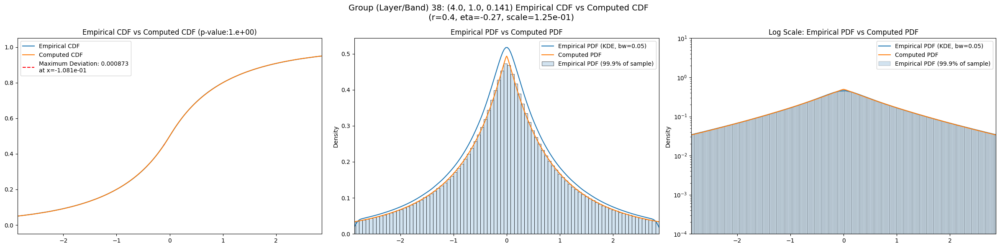

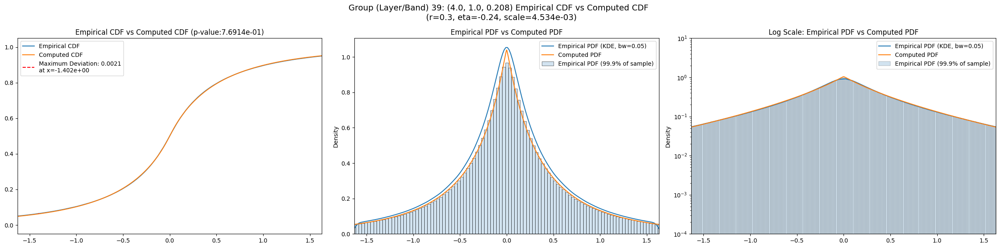

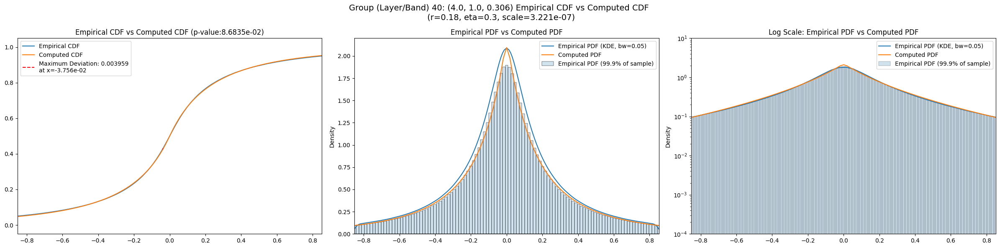

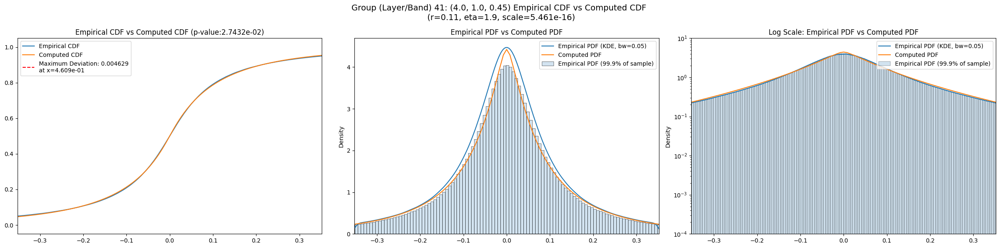

In [ ]:
for group in GROUPS:
    group_info = master_df.loc[group]
    best_r = group_info['best_r']
    best_eta = group_info['best_eta']
    best_scale = group_info['best_scale']
    fig = visualize_cdf_pdf(sample = group_data_map[group], 
                    params = (best_r, best_eta, best_scale), 
                    log_scale = True,
                    group = f"{group}: {filter_group_map[group]}")
    fig.savefig(os.path.join(CWD, "plots", f'compare_cdf_pdf_layer_{group}.jpg'), bbox_inches = 'tight', dpi = 100)

## Comparing with Gaussian and Laplace Priors

In [ ]:
def generate_func(sample, distro, *args, n_samples=200):
    if distro == 'gaussian' or distro == 'normal':
        def var_func(var):
            cdf = scipy.stats.norm(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'laplace':
        def var_func(var):
            cdf = scipy.stats.laplace(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 't':
        def var_func(var):
            cdf = scipy.stats.t(df=2, scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'prior_r':
        eta = args[0]
        def r_func(r):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return r_func
    elif distro == 'prior_eta':
        r = args[0]
        def eta_func(eta):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return eta_func
    elif distro == 'prior':
        def r_eta_func(params):
            r = params[0]
            eta = params[1]
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample, cdf)
        return r_eta_func
    elif distro == 'prior_with_scale':
        def r_eta_scale_func(params):
            r = params[0]
            eta = params[1]
            scale = params[2]
            print(r, eta, scale)
            cdf = compute_prior_cdf(r = r, eta = eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample/ np.sqrt(scale), cdf)
        return r_eta_scale_func

    print("Please enter a valid argument for `distro`: 'gaussian', 'laplace', 'prior_r', 'prior_eta', 'prior','prior_with_scale', 't'")

In [ ]:
master_df_path = Path(os.path.join(CWD, "CSVs", 'master_df.csv'))

if RERUN or not master_df_path.exists():
    upper_bound = int(1e6)
    for group in GROUPS:
        if len(group_data_map[group]) == 0:
            continue
        norm_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'gaussian'), method = 'bounded', bounds = (0, upper_bound))
        laplace_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'laplace'), method = 'bounded', bounds = (0, upper_bound))
        t_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 't'), method = 'bounded', bounds = (0, upper_bound))
        
        master_df.loc[group, 'param_gaussian'] = round_to_sigfigs(norm_result['x'], 6)
        master_df.loc[group, 'kstest_stat_gaussian'] = round_to_sigfigs(norm_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_gaussian'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_gaussian']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6) 

        master_df.loc[group, 'param_t'] = round_to_sigfigs(t_result['x'], 6)
        master_df.loc[group, 'kstest_stat_t'] = round_to_sigfigs(t_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_t'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_t']), 6) 

        master_df.loc[group, 'kstest_pval_gengamma'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_best']))

    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df.csv'))
    
master_df = pd.read_csv(os.path.join(CWD, "CSVs", 'master_df.csv'), index_col = GROUP)
master_df

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,param_gaussian,kstest_stat_gaussian,kstest_pval_gaussian,param_laplace,kstest_stat_laplace,kstest_pval_laplace,param_t,kstest_stat_t,kstest_pval_t,kstest_pval_gengamma
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",66.027500,54.146038,78.471810,2.872609,1.310862,8.945055,16384000.0,"(2.0, 0.5, 0.044)",0.000828,...,6.779590,0.023728,0.0,5.935560,0.005797,0.000000e+00,4.792160,0.011384,0.0,5.420232e-06
1,"(2.0, 0.5, 0.065)",26.310843,21.517254,32.023525,3.199361,1.414631,9.393432,16384000.0,"(2.0, 0.5, 0.065)",0.001469,...,4.123700,0.028288,0.0,3.599170,0.001643,7.579750e-39,2.939370,0.009722,0.0,6.533030e-10
2,"(2.0, 0.5, 0.096)",9.566076,7.822888,11.649402,4.244763,1.784425,15.088311,16384000.0,"(2.0, 0.5, 0.096)",0.001272,...,2.358980,0.033288,0.0,2.064470,0.005225,0.000000e+00,1.696610,0.009908,0.0,1.107670e-05
3,"(2.0, 0.5, 0.141)",3.654214,2.947185,4.602266,5.157766,2.219726,21.337349,16384000.0,"(2.0, 0.5, 0.141)",0.002600,...,1.376380,0.039173,0.0,1.203200,0.011131,0.000000e+00,0.980858,0.014872,0.0,5.403755e-43
4,"(2.0, 0.5, 0.208)",1.246894,0.973456,1.553282,6.502080,2.953488,27.303137,16384000.0,"(2.0, 0.5, 0.208)",0.003327,...,0.750723,0.044623,0.0,0.656821,0.016620,0.000000e+00,0.531794,0.018983,0.0,7.196598e-117
5,"(2.0, 0.5, 0.306)",0.311960,0.240554,0.415629,9.978146,3.126065,66.287040,16384000.0,"(2.0, 0.5, 0.306)",0.004355,...,0.351386,0.047944,0.0,0.308174,0.020166,0.000000e+00,0.248053,0.020794,0.0,7.820872e-181
6,"(2.0, 0.5, 0.45)",0.174408,0.132992,0.256785,11.664751,3.498166,98.722450,16384000.0,"(2.0, 0.5, 0.45)",0.004301,...,0.263406,0.047682,0.0,0.231040,0.019912,0.000000e+00,0.186143,0.020303,0.0,5.118156e-191
7,"(2.0, 1.0, 0.044)",87.427610,73.475105,104.673020,3.099155,1.374583,9.448888,16384000.0,"(2.0, 1.0, 0.044)",0.000620,...,7.874100,0.021428,0.0,6.903170,0.008889,0.000000e+00,5.562680,0.011834,0.0,4.399202e-05
8,"(2.0, 1.0, 0.065)",35.733710,29.532925,43.861973,3.527104,1.554718,10.987603,16384000.0,"(2.0, 1.0, 0.065)",0.001197,...,4.837170,0.026322,0.0,4.232410,0.004299,1.968450e-263,3.422420,0.009591,0.0,2.264070e-08


## Results

In [ ]:
import pandas as pd
import os
master_df = pd.read_csv(os.path.join(os.getcwd(), "CSVs", 'master_df.csv'), index_col = 0)

In [ ]:
master_df.filter(regex="kstest_stat.*")

,kstest_stat_initial,kstest_stat_cutoff_0.05,kstest_stat_best,kstest_stat_gaussian,kstest_stat_laplace,kstest_stat_t
filter_idx,,,,,,
0,0.000828,0.000336,0.000625,0.023728,0.005797,0.011384
1,0.001469,0.000336,0.000816,0.028288,0.001643,0.009722
2,0.001272,0.000336,0.000608,0.033288,0.005225,0.009908
3,0.002600,0.000336,0.001730,0.039173,0.011131,0.014872
4,0.003327,0.000336,0.002860,0.044623,0.016620,0.018983
5,0.004355,0.000336,0.003560,0.047944,0.020166,0.020794
6,0.004301,0.000336,0.003660,0.047682,0.019912,0.020303
7,0.000620,0.000336,0.000572,0.021428,0.008889,0.011834
8,0.001197,0.000336,0.000747,0.026322,0.004299,0.009591


In [ ]:
master_df.filter(regex="best.*")

,best_augmented_var,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff
filter_idx,,,,,,
0,66.027496,0.000625,0.65,0.10,1.424371e+01,0.0
1,26.310843,0.000816,0.74,-0.30,1.208497e+01,0.0
2,9.566076,0.000608,0.70,-0.48,4.694737e+00,0.0
3,3.654214,0.001730,0.64,-0.60,1.667625e+00,0.0
4,1.246894,0.002860,0.51,-0.60,2.676841e-01,0.0
5,0.311960,0.003560,0.35,-0.40,5.955489e-03,0.0
6,0.174408,0.003660,0.35,-0.40,3.329544e-03,0.0
7,87.427612,0.000572,0.29,2.20,9.881364e-03,0.0
8,35.733711,0.000747,0.46,0.40,1.244941e+00,0.0
